# **Stellar Body Class Prediction**

**Dataset**: [`https://www.kaggle.com/competitions/playground-series-s6e6`](https://www.kaggle.com/competitions/playground-series-s6e6)<br>
**GitHub Repo**: [`https://github.com/311stefanos/StellarClassPrediction`](https://github.com/311stefanos/StellarClassPrediction)

## Team Members:

- **Stefanos Panteli** ([stefanos.panteli3112003@gmail.com](stefanos.panteli3112003@gmail.com))

---

---

# Installs

In [ ]:
# %pip install ipykernel pandas matplotlib seaborn numpy jinja2 scikit-learn imbalanced-learn

---

---

# Imports

In [1]:
# Imports from sklearn
from sklearn.metrics import (
    accuracy_score, balanced_accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,
    roc_curve, precision_recall_curve, average_precision_score, confusion_matrix, classification_report
)
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV, cross_validate
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier
from sklearn.preprocessing import PowerTransformer, RobustScaler, label_binarize
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.base import clone
# Imports from imbalanced-learn
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE

# Imports for plotting
import matplotlib.colors as mcolors
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

# Imports from others
from typing import Literal, Optional, List, Any
from copy import deepcopy
from math import ceil
import pandas as pd
import numpy as np
import time

import warnings
warnings.filterwarnings('ignore')

---

---

# Global Functions & Constants

In [2]:
BOLD = '\033[1m'
UNDERLINE = '\033[4m'
CYAN = '\033[96m'
RESET = '\033[0m'

CLASS_COLOURS = {
    'GALAXY': '#59A14F',
    'QSO': '#F28E2B',
    'STAR': '#4E79A7'
}
CLASS_ORDER = ['GALAXY', 'QSO', 'STAR']

def nicely_print(title: str, content: str = '') -> None:
    '''
    `nicely_print` prints a nicely formatted title and content.
    Meant to be used in the begining of a cell, or before showing a graph.

    `Args:`
        - title (str): The title of the cell. Will be formatted in bold, underlined and in cyan.
        - content (str): The content of the print message. Will only be formatted bold.
    '''
    print(f'{BOLD}{UNDERLINE}{CYAN}{title}{RESET} {BOLD}{content}{RESET}\n')

---

---

# Data Preparation

## Load Data

In [ ]:
# Read CSV File
df = pd.read_csv('train.csv')
nicely_print('Dataset:', 'train.csv with stellar information')
df.drop(columns= ['id'], inplace= True)

Dataset: train.csv with stellar information



## Train-Test Split

In [ ]:
nicely_print('Train & Eval Split')

X_train, X_test, y_train, y_test = train_test_split(
    df.drop(columns=['class']), 
    df['class'],
    test_size=0.2,
    random_state=1,
    stratify= df['class']
)

print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')
y_test_original = y_test

Train & Eval Split 

X_train shape: (461877, 10)
y_train shape: (461877,)
X_test shape: (115470, 10)
y_test shape: (115470,)


## Low & High Redshift Subsets

In [ ]:
redshift_threshold = 0.3

In [ ]:
low_train_mask = X_train['redshift'] < redshift_threshold
low_test_mask = X_test['redshift'] < redshift_threshold

low_X_train = X_train.loc[low_train_mask].copy()
low_y_train = y_train.loc[low_train_mask].copy()

low_X_test = X_test.loc[low_test_mask].copy()
low_y_test = y_test_original.loc[low_test_mask].copy()

print(low_X_train.shape)
print(low_y_train.value_counts())
print(low_X_test.shape)
print(low_y_test.value_counts())
low_y_test_original = low_y_test

In [ ]:
high_train_mask = X_train['redshift'] >= redshift_threshold
high_test_mask = X_test['redshift'] >= redshift_threshold

high_X_train = X_train.loc[high_train_mask].copy()
high_y_train = y_train.loc[high_train_mask].copy()

high_X_test = X_test.loc[high_test_mask].copy()
high_y_test = y_test_original.loc[high_test_mask].copy()

print(high_X_train.shape)
print(high_y_train.value_counts())
print(high_X_test.shape)
print(high_y_test.value_counts())
high_y_test_original = high_y_test

---

---

# EDA

## Dataset Overview

In [ ]:
nicely_print('Dataset Info', 'Non Null entries per column & Datatypes')
df.info()

Dataset Info Non Null entries per column & Datatypes

<class 'pandas.DataFrame'>
RangeIndex: 577347 entries, 0 to 577346
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   alpha              577347 non-null  float64
 1   delta              577347 non-null  float64
 2   u                  577347 non-null  float64
 3   g                  577347 non-null  float64
 4   r                  577347 non-null  float64
 5   i                  577347 non-null  float64
 6   z                  577347 non-null  float64
 7   redshift           577347 non-null  float64
 8   spectral_type      577347 non-null  str    
 9   galaxy_population  577347 non-null  str    
 10  class              577347 non-null  str    
dtypes: float64(8), str(3)
memory usage: 48.5 MB


> &emsp;<br>
> The **descriptions** for each column:
> <br>
> 1. `alpha`: Right ascension angle (RA) - Equivalnet to longitude
>     * 0 <= alpha < 360
> 2. `delta`: Declination angle (Dec) - Equivalent to latitude
>     * -90 <= delta <= 90
> <br>
> <br>
> - Together, `alpha` and `delta` give the location of the object.
> <br>
> <br>
> 3. `u`: Ultraviolet filter in the photometric system
> 4. `g`: Green filter in the photometric system
> 5. `r`: Red filterin the photometric system
> 6. `i`: Near infrared filter in the photometric system
> 7. `z`: Infrared filter in the photometric system
> <br>
> <br>
>     * All colour brightness are typically between 10 and 30. Lower value is brighter
> <br>
> <br>
> - Each of the `u`, `g`, `r`, `i`, `z` values are the brightness of the object at a specific wavelength.
> <br>
> <br>
> 8. `redshift`: Redshift value based on the increase in wavelength.
>     * How away is the object. Higher value means it is further away.
> 9. `spectral_type`: Indicates the hottness of the object. 
>     * Hottest O → B → A → F → G → K → M Coolest
> 10. `galaxy_population`: Sub-category.
> 11. `class`: The target
> <br>&emsp;

## Class Distribution

Class Rate Amount of entries per category, and their percentage.



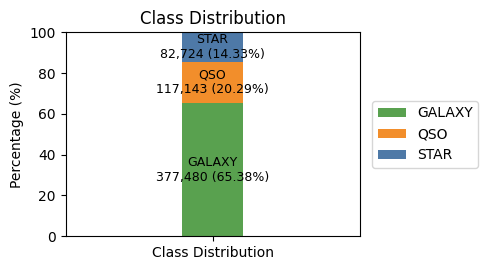

In [ ]:
nicely_print('Class Rate', 'Amount of entries per category, and their percentage.')

target = df['class']

summary = (
    target.value_counts(dropna= False)
    .rename_axis('class')
    .to_frame('count')
    .assign(percent=lambda x: (x['count'] / x['count'].sum() * 100).round(2))
    .sort_index()
)

# Plot
labels = ['GALAXY', 'QSO', 'STAR']
counts = summary['count'].values
percents = summary['percent'].values

# Single stacked bar
fig, ax = plt.subplots(figsize=(5, 2.8))

bottom = 0
bar_width = 0.25

for i in range(len(labels)):
    ax.bar(
        x= [0],
        height= [percents[i]],
        bottom= bottom,
        width= bar_width,
        color= CLASS_COLOURS[labels[i]],
        label= labels[i]
    )

    if percents[i] > 0:
        y_center = bottom + percents[i] / 2
        ax.annotate(
            f'{labels[i]}\n{counts[i]:,} ({percents[i]:.2f}%)',
            xy= (0, y_center), ha= 'center', va= 'center',
            fontsize= 9, color= 'black'
        )

    bottom += percents[i]

ax.set_title('Class Distribution')
ax.set_ylabel('Percentage (%)')
ax.set_ylim(0, 100)
ax.set_xlim(-0.6, 0.6)
ax.set_xticks([0])
ax.set_xticklabels(['Class Distribution'])
ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))
plt.tight_layout()
plt.show()

> &emsp;<br>
> There is **severe class imbalance** between the three classes.
> Possible handling methods:
> 1. **Under-sampling** the Galaxy class - since there are a lot of entries.
> 2. **Over-sampling** using SMOTE or other oversampling methods.
> <br>&emsp;

## Dataset Visualisation

Celestial Maps Redshift and Class side by side



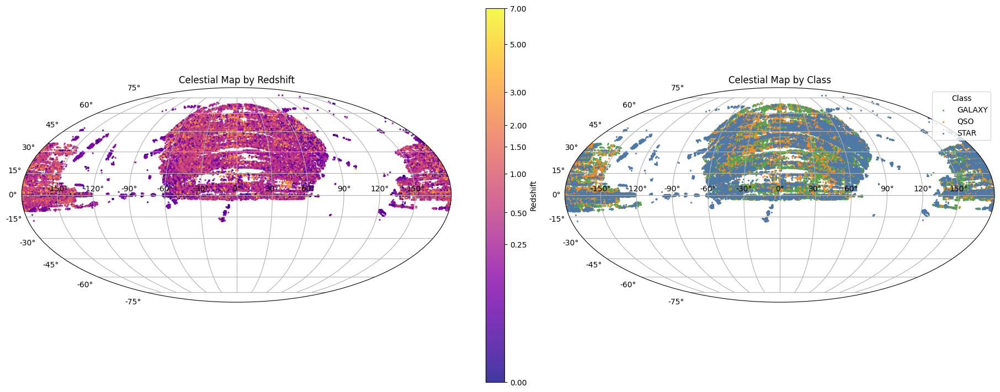

In [ ]:
nicely_print('Celestial Maps', 'Redshift and Class side by side')

# Same sample for both plots
df_sample = df.sample(frac=0.4, random_state=42).copy()

# Convert once
ra_rad = np.radians(df_sample['alpha'].values - 180)   # Mollweide uses -180° to +180°
dec_rad = np.radians(df_sample['delta'].values)

fig, axes = plt.subplots(
    1, 2,
    figsize=(18, 7),
    subplot_kw={'projection': 'mollweide'},
    constrained_layout=True
)

# Left: Redshift
sc = axes[0].scatter(
    ra_rad,
    dec_rad,
    c=df_sample['redshift'],
    s=2,
    cmap='plasma',
    norm=mcolors.PowerNorm(
        gamma=0.3,
        vmin=0,
        vmax=df_sample['redshift'].max()
    ),
    alpha=0.8
)

axes[0].set_title('Celestial Map by Redshift')
axes[0].grid(True)

cbar = fig.colorbar(
    sc,
    ax=axes[0],
    pad=0.08,
    ticks=[0, 0.25, 0.5, 1, 1.5, 2, 3, 5, 7]
)
cbar.set_label('Redshift')

# Right: Class
for cls in CLASS_ORDER:
    cls_df = df_sample[df_sample['class'] == cls]

    cls_ra_rad = np.radians(cls_df['alpha'].values - 180)
    cls_dec_rad = np.radians(cls_df['delta'].values)

    axes[1].scatter(
        cls_ra_rad,
        cls_dec_rad,
        s=2,
        color=CLASS_COLOURS[cls],
        label=cls,
        alpha=0.8
    )

axes[1].set_title('Celestial Map by Class')
axes[1].grid(True)
axes[1].legend(title='Class', loc='upper right')

plt.show()

In [ ]:
def plot_interactive_3d_celestial_map(
    data: pd.DataFrame,
    class_col: str = 'class',
    sample_frac: float = 0.2,
    title: str = 'Interactive 3D Celestial Map',
    colour_col: str | None = None,
    actual_col: str | None = None,
    predicted_col: str | None = None,
    wrong_only: bool = False,
    random_state: int = 42,
    point_size: int = 2
) -> None:
    
    df_sample = data.copy()

    if colour_col is None:
        colour_col = class_col

    if wrong_only:
        if actual_col is None or predicted_col is None:
            raise ValueError('actual_col and predicted_col are required when wrong_only=True.')

        df_sample = df_sample[df_sample[actual_col] != df_sample[predicted_col]].copy()

    if sample_frac < 1:
        df_sample = df_sample.sample(frac= sample_frac, random_state= random_state).copy()

    ra = np.radians(df_sample['alpha'].values)
    dec = np.radians(df_sample['delta'].values)

    r = np.sqrt(df_sample['redshift'].values)

    df_sample['x'] = r * np.cos(dec) * np.cos(ra)
    df_sample['y'] = r * np.cos(dec) * np.sin(ra)
    df_sample['z'] = r * np.sin(dec)

    fig = go.Figure()

    for cls in CLASS_ORDER:
        cls_df = df_sample[df_sample[colour_col] == cls]

        if len(cls_df) == 0:
            continue

        hover_text = []

        for _, row in cls_df.iterrows():
            text = (
                f"Class: {row.get(class_col, '')}<br>"
                f"Redshift: {row['redshift']:.3f}<br>"
                f"Alpha: {row['alpha']:.2f}<br>"
                f"Delta: {row['delta']:.2f}"
            )

            if actual_col is not None and predicted_col is not None:
                text += (
                    f"<br>Actual: {row[actual_col]}"
                    f"<br>Predicted: {row[predicted_col]}"
                )

            hover_text.append(text)

        fig.add_trace(
            go.Scatter3d(
                x= cls_df['x'],
                y= cls_df['y'],
                z= cls_df['z'],
                mode= 'markers',
                name= cls,
                marker= dict(
                    size= point_size,
                    color= CLASS_COLOURS[cls],
                    opacity= 0.8
                ),
                text= hover_text,
                hovertemplate= '%{text}<extra></extra>'
            )
        )

    fig.update_layout(
        height= 750,
        width= 1000,
        title= title,
        scene= dict(
            xaxis_title= 'X',
            yaxis_title= 'Y',
            zaxis_title= 'Z'
        ),
        legend= dict(
            title= colour_col,
            itemsizing= 'constant',
            font= dict(size= 13),
            title_font= dict(size= 14)
        )
    )

    fig.show()


nicely_print('Interactive 3D Celestial Map', 'Class only')

plot_interactive_3d_celestial_map(
    data= df,
    class_col= 'class',
    colour_col= 'class',
    sample_frac= 0.2,
    title= 'Interactive 3D Celestial Map by Class'
)

Interactive 3D Celestial Map Class only



## Nearest Neighbour Exploration

Nearest Neighbour EDA Testing rank-1, majority vote, and distance-weighted vote



,id,class,mean_neighbour_distance,rank1_class,majority_class,weighted_class
0,257748,QSO,0.017912,QSO,QSO,QSO
1,177851,STAR,0.000650,STAR,STAR,STAR
2,562767,QSO,0.061091,QSO,QSO,QSO
3,351391,GALAXY,0.013242,GALAXY,GALAXY,GALAXY
4,12001,GALAXY,0.013983,GALAXY,GALAXY,GALAXY


,rank1_class,majority_class,weighted_class
class,,,
GALAXY,89.48,92.55,92.35
QSO,81.77,81.05,81.41
STAR,75.16,78.77,78.69


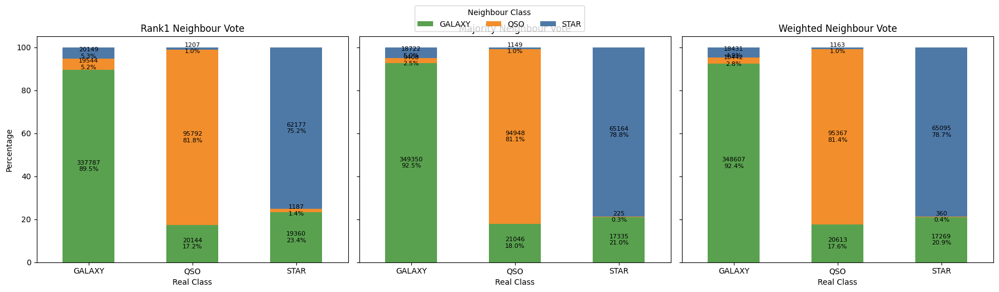

In [ ]:
nicely_print(
    'Nearest Neighbour EDA',
    'Testing rank-1, majority vote, and distance-weighted vote'
)

SAMPLE_FRAC = 1
K_NEIGHBOURS = 5

df_nn = df.sample(frac=SAMPLE_FRAC, random_state=42).copy()

# Create x, y, z position features
ra = np.radians(df_nn['alpha'].values)
dec = np.radians(df_nn['delta'].values)
r = df_nn['redshift'].values

df_nn['x'] = r * np.cos(dec) * np.cos(ra)
df_nn['y'] = r * np.cos(dec) * np.sin(ra)
df_nn['z'] = r * np.sin(dec)

position_cols = ['x', 'y', 'z']

# +1 because neighbour 0 is the record itself
knn = NearestNeighbors(
    n_neighbors= K_NEIGHBOURS + 1,
    algorithm= 'kd_tree',
    metric= 'euclidean',
    n_jobs= -1
)

knn.fit(df_nn[position_cols])
distances, neighbours = knn.kneighbors(df_nn[position_cols])

# Remove self-neighbour
neighbour_distances = distances[:, 1:]
neighbour_indices = neighbours[:, 1:]

neighbour_classes = (
    df_nn['class']
    .iloc[neighbour_indices.ravel()]
    .values
    .reshape(neighbour_indices.shape)
)

# 1. Closest neighbour only
rank1_class = neighbour_classes[:, 0]

# 2. Majority vote
majority_class = [
    pd.Series(row).value_counts().idxmax()
    for row in neighbour_classes
]

# 3. Weighted vote by closeness
weighted_class = []

for row_classes, row_distances in zip(neighbour_classes, neighbour_distances):
    weights = 1 / (row_distances + 1e-9)
    scores = {
        cls: weights[row_classes == cls].sum()
        for cls in CLASS_ORDER
    }
    weighted_class.append(max(scores, key=scores.get))


nearest_summary = pd.DataFrame({
    'id': df_nn.index,
    'class': df_nn['class'].values,
    'mean_neighbour_distance': neighbour_distances.mean(axis=1).round(6),
    'rank1_class': rank1_class,
    'majority_class': majority_class,
    'weighted_class': weighted_class
})

display(nearest_summary.head())


# Check how often each method matches the real class
method_cols = ['rank1_class', 'majority_class', 'weighted_class']

match_summary = pd.DataFrame({
    method: (nearest_summary[method] == nearest_summary['class']).groupby(nearest_summary['class']).mean() * 100
    for method in method_cols
}).reindex(CLASS_ORDER).round(2)

display(match_summary)


# Plot selected method
# Plot all 3 methods in 1x3
plot_methods = ['rank1', 'majority', 'weighted']

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

for ax, method in zip(axes, plot_methods):
    plot_col = f'{method}_class'

    nearest_count_df = (
        pd.crosstab(nearest_summary['class'], nearest_summary[plot_col])
        .reindex(index= CLASS_ORDER, columns= CLASS_ORDER)
        .fillna(0)
    )

    nearest_plot_df = (
        pd.crosstab(
            nearest_summary['class'],
            nearest_summary[plot_col],
            normalize= 'index'
        )
        .reindex(index= CLASS_ORDER, columns= CLASS_ORDER)
        .fillna(0) * 100
    )

    nearest_plot_df.plot(
        kind= 'bar', stacked= True, ax= ax, legend= False,
        color= [CLASS_COLOURS[cls] for cls in CLASS_ORDER]
    )

    ax.set_title(f'{method.title()} Neighbour Vote')
    ax.set_xlabel('Real Class')
    ax.set_ylabel('Percentage')
    ax.tick_params(axis= 'x', labelrotation= 0)

    # Add count and percentage inside each stacked segment
    for x_idx, real_class in enumerate(nearest_plot_df.index):
        bottom = 0

        for neighbour_class in nearest_plot_df.columns:
            percent = nearest_plot_df.loc[real_class, neighbour_class]
            count = nearest_count_df.loc[real_class, neighbour_class]

            if percent > 0:
                y = bottom + percent / 2

                ax.text(
                    x_idx, y, f'{count:.0f}\n{percent:.1f}%',
                    ha= 'center', va= 'center', fontsize= 8
                )

            bottom += percent

# One shared legend
handles, labels = axes[-1].get_legend_handles_labels()
fig.legend(
    handles, labels, title= 'Neighbour Class',
    loc= 'upper center', ncol= 3,
    bbox_to_anchor= (0.5, 1.05)
)

plt.tight_layout()
plt.show()

## Numerical Features

In [ ]:
nicely_print('Dataset Summary of Numerical Columns', 'Count, Mean, Std, Min, 25%, 50%, 75%, Max')
df.describe(include= 'number').T

Dataset Summary of Numerical Columns Count, Mean, Std, Min, 25%, 50%, 75%, Max



,count,mean,std,min,25%,50%,75%,max
alpha,577347.0,181.616673,96.242941,0.011684,132.161499,188.681465,231.829693,359.999810
delta,577347.0,21.834654,18.933570,-17.966988,2.474097,21.484412,36.988310,79.158322
u,577347.0,22.441926,2.018135,-0.139225,20.977090,22.570222,23.869103,28.253263
g,577347.0,21.007273,1.795426,13.535483,19.865005,21.467820,22.292715,27.620208
r,577347.0,19.962811,1.648964,12.579407,18.820671,20.431153,21.164096,25.254499
i,577347.0,19.378911,1.580059,11.962781,18.306820,19.631642,20.608191,27.910853
z,577347.0,19.041136,1.584365,11.682803,17.973192,19.188598,20.162111,26.826867
redshift,577347.0,0.723135,0.810070,-0.009970,0.181052,0.497525,0.881390,7.010780


Histogram & Boxplot alpha, delta, u, g, r, i, z, redshift



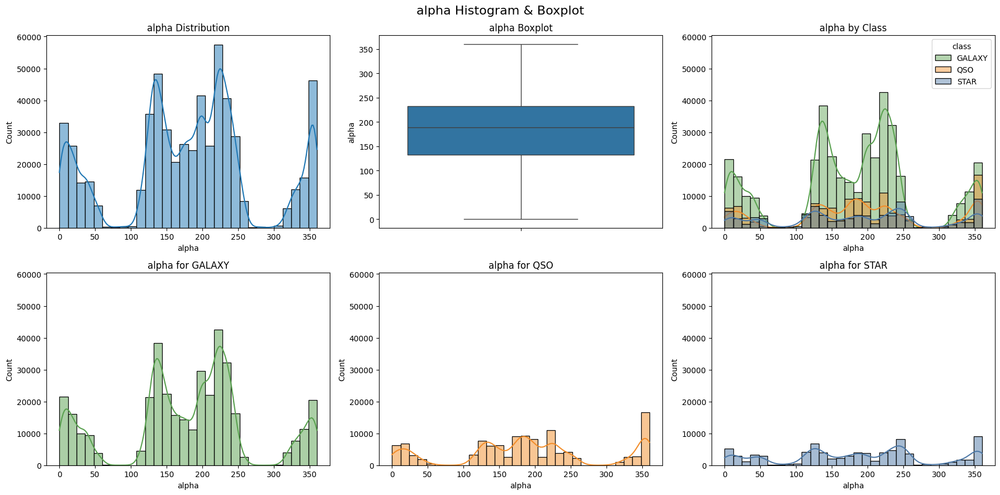

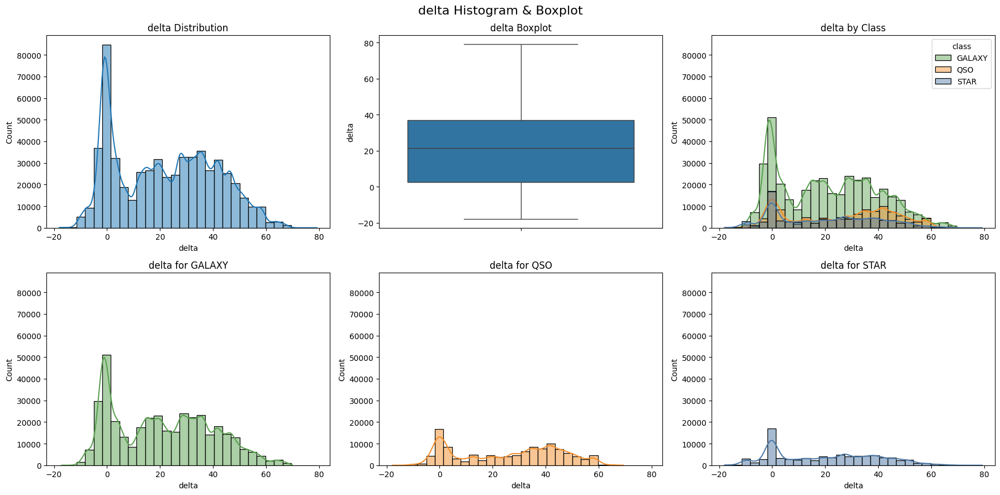

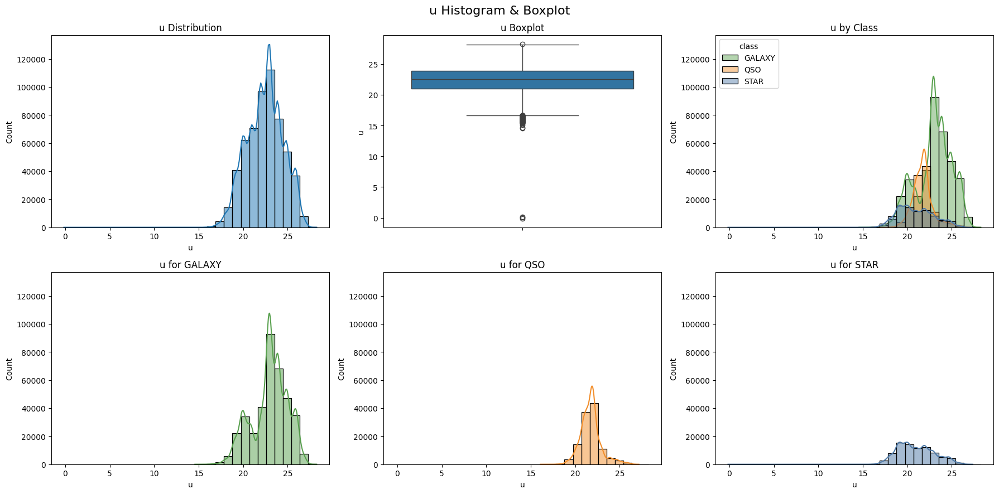

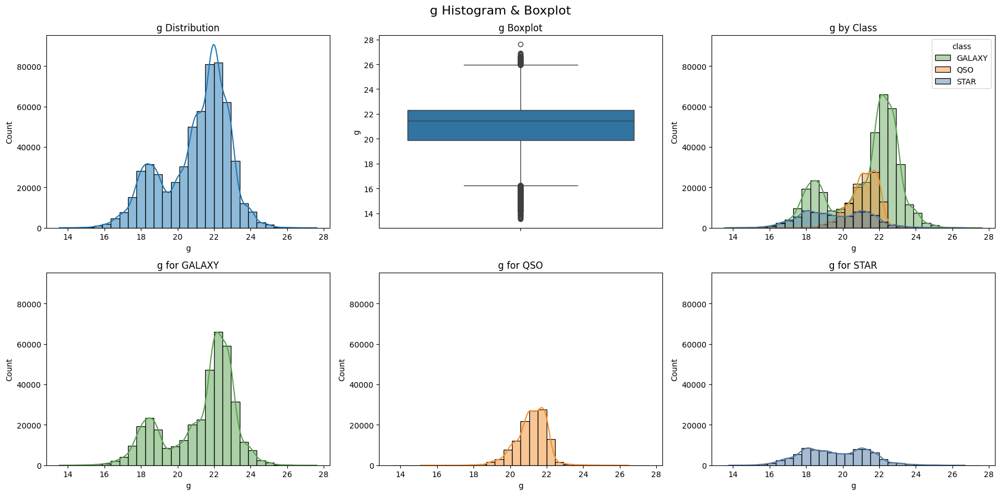

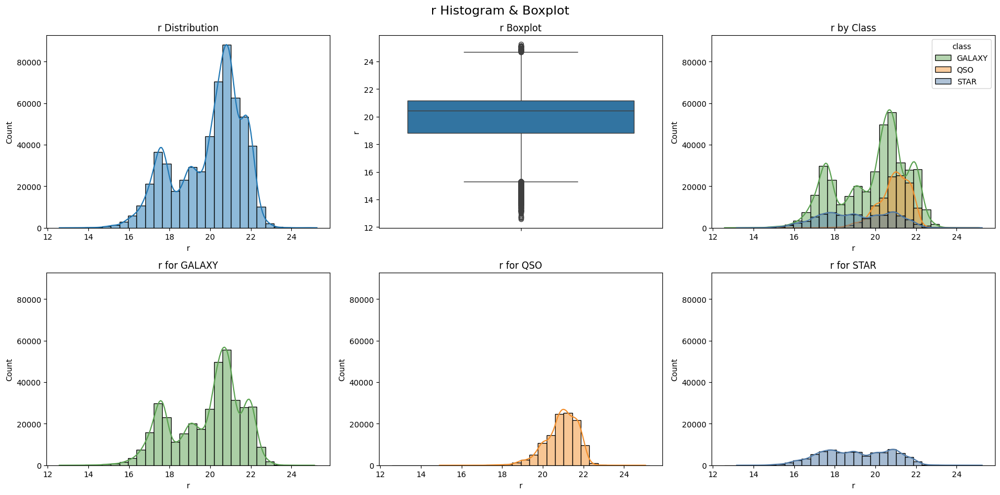

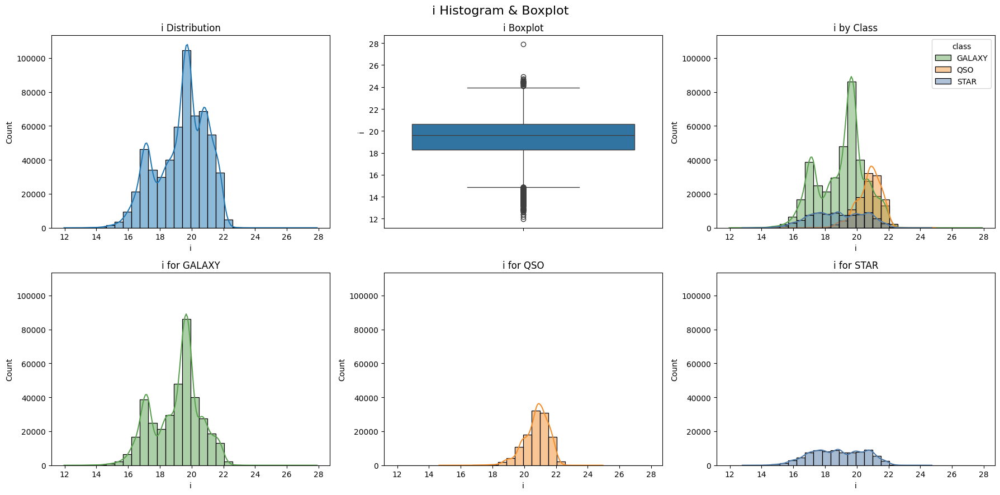

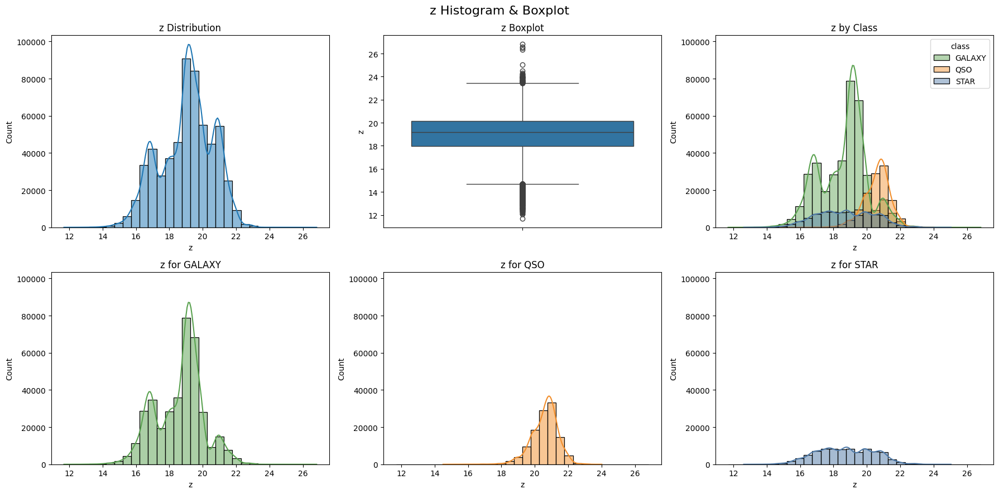

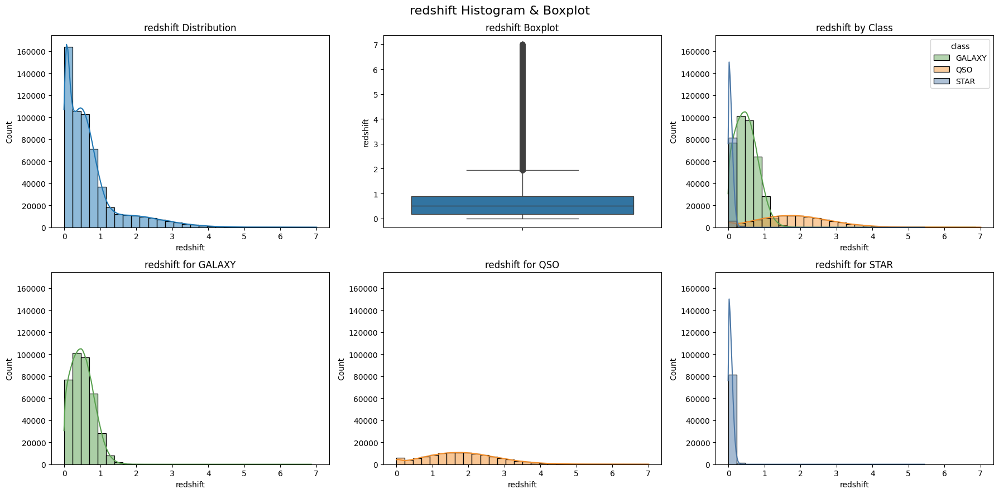

In [ ]:
numerical_cols = ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'redshift']

def plot_hist_and_boxplot(
    df: pd.DataFrame, 
    col: str,
    target_col: str = 'class'
) -> None:
    data = df.copy()

    if target_col not in data.columns:
        raise ValueError(f"Target column '{target_col}' was not found in the dataframe.")

    targets = sorted(data[target_col].dropna().unique())

    # Desired drawing order: back to front
    target_order = ['GALAXY', 'QSO', 'STAR']

    # Keep only classes that actually exist in the dataframe
    target_order = [target for target in target_order if target in targets]

    if len(target_order) != len(targets):
        raise ValueError(
            f"Expected targets {target_order}, but found {targets}. Check class names."
        )

    col_min = data[col].min()
    col_max = data[col].max()

    padding = (col_max - col_min) * 0.05
    x_min = col_min - padding
    x_max = col_max + padding

    bins = np.linspace(col_min, col_max, 31)

    fig, axes = plt.subplots(2, 3, figsize=(18, 9))
    fig.suptitle(f'{col} Histogram & Boxplot', fontsize=16)

    # Row 1, col 1: Histogram of the whole column
    sns.histplot(
        data=data,
        x=col,
        kde=True,
        bins=bins,
        ax=axes[0, 0]
    )
    axes[0, 0].set_title(f'{col} Distribution')
    axes[0, 0].set_xlim(x_min, x_max)

    # Row 1, col 2: Boxplot of the whole column
    sns.boxplot(
        data=data,
        y=col,
        ax=axes[0, 1]
    )
    axes[0, 1].set_title(f'{col} Boxplot')
    axes[0, 1].set_ylim(x_min, x_max)

    # Row 1, col 3: All target classes together
    # Draw GALAXY first, QSO second, STAR last
    for target in target_order:
        target_df = data[data[target_col] == target]

        sns.histplot(
            data=target_df,
            x=col,
            kde=True,
            bins=bins,
            color=CLASS_COLOURS[target],
            label=target,
            alpha=0.45,
            ax=axes[0, 2],
            zorder=CLASS_ORDER.index(target)
        )

    axes[0, 2].set_title(f'{col} by {target_col.title()}')
    axes[0, 2].set_xlim(x_min, x_max)
    axes[0, 2].legend(title=target_col)

    # Row 2: One histogram per target class
    for i, target in enumerate(target_order):
        target_df = data[data[target_col] == target]

        sns.histplot(
            data=target_df,
            x=col,
            kde=True,
            bins=bins,
            color=CLASS_COLOURS[target],
            ax=axes[1, i]
        )

        axes[1, i].set_title(f'{col} for {target}')
        axes[1, i].set_xlim(x_min, x_max)

    # Same y-axis count scale for all histograms
    hist_axes = [
        axes[0, 0],
        axes[0, 2],
        axes[1, 0],
        axes[1, 1],
        axes[1, 2]
    ]

    max_y = max(ax.get_ylim()[1] for ax in hist_axes)

    for ax in hist_axes:
        ax.set_ylim(0, max_y)

    plt.tight_layout()
    plt.show()


nicely_print('Histogram & Boxplot', ', '.join(numerical_cols))

for col in numerical_cols:
    plot_hist_and_boxplot(df, col, target_col='class')

> &emsp;<br>
> Overall, there are **not many differences** across the classes.
> The difference in height is expected due to the class imbalance.
> <br><br>
> The only difference is in the `redshift` column, where STAR only gets a few values, and QSO is much more spread.
> * `redshift` is also really skewed, with a large number of values around 0.
> <br>&emsp;

## Categorical Features

In [ ]:
nicely_print('Dataset Summary of Categorical Columns', 'All values sorted by frequency')

categorical_cols = df.select_dtypes(exclude='number').columns

max_len = {
    col: df[col].astype(str).str.len().max()
    for col in categorical_cols
}

categorical_summary = pd.DataFrame({
    f'{col.strip()} (freq)': pd.Series([
        f'{value} ' + ' '*(max_len[col] - len(str(value))) + f"{f'({freq:_})':>10}"
        for value, freq in df[col].value_counts(dropna=False).items()
    ])
    for col in categorical_cols
})

display(categorical_summary.style.set_properties(**{
    'white-space': 'pre',
    'font-family': 'monospace'
}))

Dataset Summary of Categorical Columns All values sorted by frequency



,spectral_type (freq),galaxy_population (freq),class (freq)
0,M (303_323),Red_Sequence (319_565),GALAXY (377_480)
1,A/F (122_122),Blue_Cloud (257_782),QSO (117_143)
2,G/K (108_546),nan,STAR (82_724)
3,O/B (43_356),nan,nan


Categorical Data Categories Summary Row 1: All data, Row 2: GALAXY, Row 3: QSO, Row 4: STAR



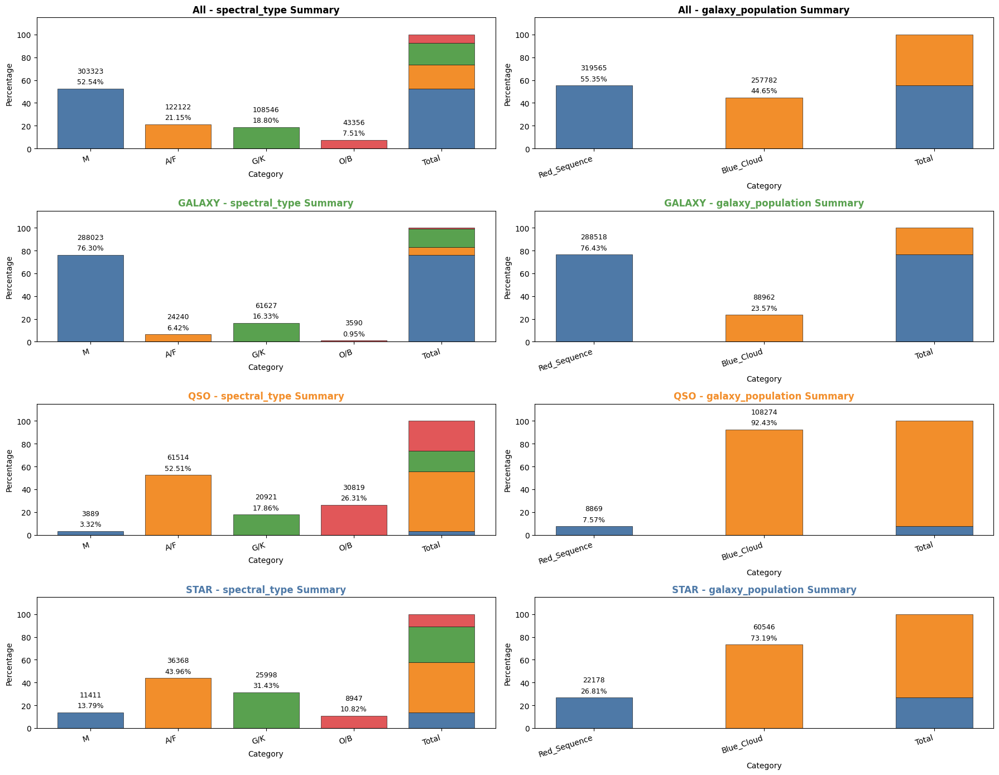

In [ ]:
def make_category_summary(
    df: pd.DataFrame,
    col: str,
    category_order: list
) -> pd.DataFrame:
    
    summary = (
        df[col]
        .value_counts(dropna=False)
        .reindex(category_order, fill_value=0)
        .rename_axis('category')
        .to_frame('count')
        .reset_index()
    )

    total = summary['count'].sum()

    if total > 0:
        summary['percent'] = (summary['count'] / total * 100).round(2)
    else:
        summary['percent'] = 0

    return summary


def plot_category_summary(
    summary: pd.DataFrame,
    col: str,
    ax,
    colour_map: dict,
    title_prefix: str = '',
    title_colour: str = 'black',
    bar_width: float = 0.75
) -> None:
    
    categories = summary['category'].tolist()
    percentages = summary['percent'].tolist()
    counts = summary['count'].tolist()

    x_positions = np.arange(len(categories))
    colours = [colour_map[category] for category in categories]

    # Normal category bars
    ax.bar(
        x_positions,
        percentages,
        color=colours,
        width=bar_width,
        edgecolor='black',
        linewidth=0.4
    )

    # Final accumulated 100% stacked bar
    total_x = len(categories)
    bottom = 0

    for category, percent in zip(categories, percentages):
        ax.bar(
            total_x,
            percent,
            bottom=bottom,
            color=colour_map[category],
            width=bar_width,
            edgecolor='black',
            linewidth=0.4
        )
        bottom += percent

    x_labels = [str(category) for category in categories] + ['Total']

    ax.set_xticks(list(x_positions) + [total_x])
    ax.set_xticklabels(x_labels)

    title = f'{col} Summary'

    if title_prefix:
        title = f'{title_prefix} - {title}'

    ax.set_title(title, color=title_colour, fontweight='bold')
    ax.set_xlabel('Category')
    ax.set_ylabel('Percentage')

    # Extra space for labels above bars
    ax.set_ylim(0, 115)

    # Keep labels angled
    ax.tick_params(axis='x', labelrotation=18)

    for lbl in ax.get_xticklabels():
        lbl.set_horizontalalignment('right')

    # Percent and count always above each normal bar
    for x, percent, count_val in zip(x_positions, percentages, counts):
        if percent == 0:
            continue

        ax.annotate(
            f'{percent:.2f}%',
            (x, percent),
            ha='center',
            va='bottom',
            xytext=(0, 4),
            textcoords='offset points',
            fontsize=9
        )

        ax.annotate(
            f'{count_val:.0f}',
            (x, percent),
            ha='center',
            va='bottom',
            xytext=(0, 18),
            textcoords='offset points',
            fontsize=9
        )


nicely_print(
    'Categorical Data Categories Summary',
    'Row 1: All data, Row 2: GALAXY, Row 3: QSO, Row 4: STAR'
)

categorical_columns = categorical_cols.drop('class')
target_col = 'class'
target_order = ['GALAXY', 'QSO', 'STAR']

target_colours = CLASS_COLOURS
target_colours['All'] = 'black'

# Fixed category order per column, based on the full dataframe
category_orders = {
    col: (
        df[col]
        .value_counts(dropna=False)
        .sort_values(ascending=False)
        .index
        .tolist()
    )
    for col in categorical_columns
}

# Better fixed colours for categorical values
base_palette = [
    '#4E79A7',  # blue
    '#F28E2B',  # orange
    '#59A14F',  # green
    '#E15759',  # red
    '#76B7B2',  # teal
    '#EDC948',  # yellow
    '#B07AA1',  # purple
    '#FF9DA7',  # pink
    '#9C755F',  # brown
    '#BAB0AC'   # grey
]

colour_maps = {}

for col in categorical_columns:
    categories = category_orders[col]

    colour_maps[col] = {
        category: base_palette[i % len(base_palette)]
        for i, category in enumerate(categories)
    }

n_rows = 1 + len(target_order)
n_cols = len(categorical_columns)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 14))

# Row 1: all data
for j, col in enumerate(categorical_columns):
    summary = make_category_summary(
        df=df,
        col=col,
        category_order=category_orders[col]
    )

    bar_width = 0.45 if j == 1 else 0.75

    plot_category_summary(
        summary=summary,
        col=col,
        ax=axes[0, j],
        colour_map=colour_maps[col],
        title_prefix='All',
        title_colour=target_colours['All'],
        bar_width=bar_width
    )

# Rows 2-4: one row per target class
for i, target in enumerate(target_order, start=1):
    target_df = df[df[target_col] == target]

    for j, col in enumerate(categorical_columns):
        summary = make_category_summary(
            df=target_df,
            col=col,
            category_order=category_orders[col]
        )

        bar_width = 0.45 if j == 1 else 0.75

        plot_category_summary(
            summary=summary,
            col=col,
            ax=axes[i, j],
            colour_map=colour_maps[col],
            title_prefix=target,
            title_colour=target_colours[target],
            bar_width=bar_width
        )

plt.tight_layout()
plt.show()

> &emsp;<br>
> 1. **GALAXY**:
>     * `spectral_type` mostly M, followed by G/K
>     * `galaxy_population` 75% Red_Sequence, and 25% Blue_Cloud
> 2. **QSO**:
>     * `spectral_type` mostly A/F, followed by O/B and G/K
>     * `galaxy_population` mostly Blue_Cloud 
> 3. **STAR**:
>     * `spectral_type` the most balanced out of the 3, with leading A/F and closely followed by G/K
>     * `galaxy_population` 73% Blue_Cloud, 27% Red_Sequence
> <br><br>
> - A `spectral_type` of M or a `galaxy_population` of Red_Sequence is probably a galaxy
> <br>&emsp;

## Pair Plot

Pair Plot 



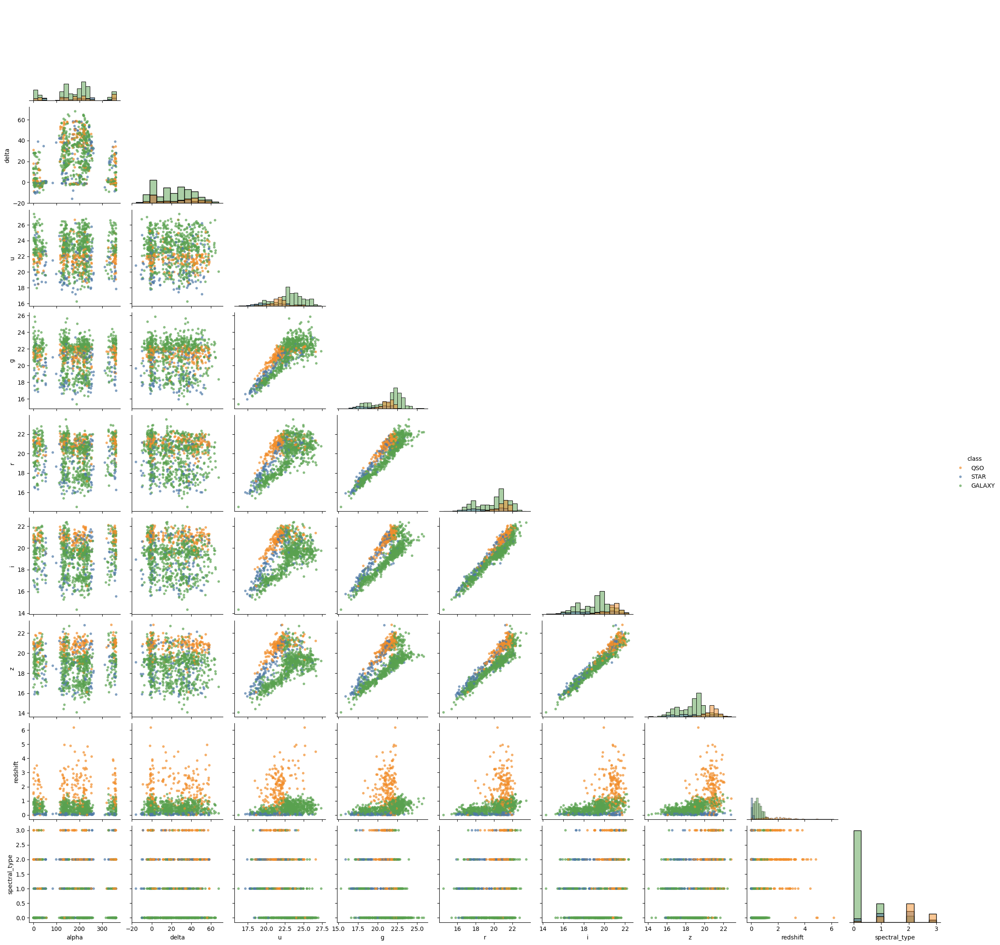

In [ ]:
nicely_print('Pair Plot')

target_col = 'class'
plot_cols = numerical_cols + ['spectral_type', target_col]

random_sample = df[plot_cols].sample(n=1000, random_state=42)
random_sample['spectral_type'] = random_sample['spectral_type'].map({'M': 0, 'G/K': 1, 'A/F': 2, 'O/B': 3})

sns.pairplot(
    random_sample,
    vars=numerical_cols + ['spectral_type'],
    hue=target_col,
    diag_kind='hist',
    corner=True,
    palette=CLASS_COLOURS,
    plot_kws={
        'alpha': 0.7,
        's': 18,
        'edgecolor': 'none'
    }
)

plt.show()

## Correlation Heatmap

Correlation of Numeric Columns with Class 



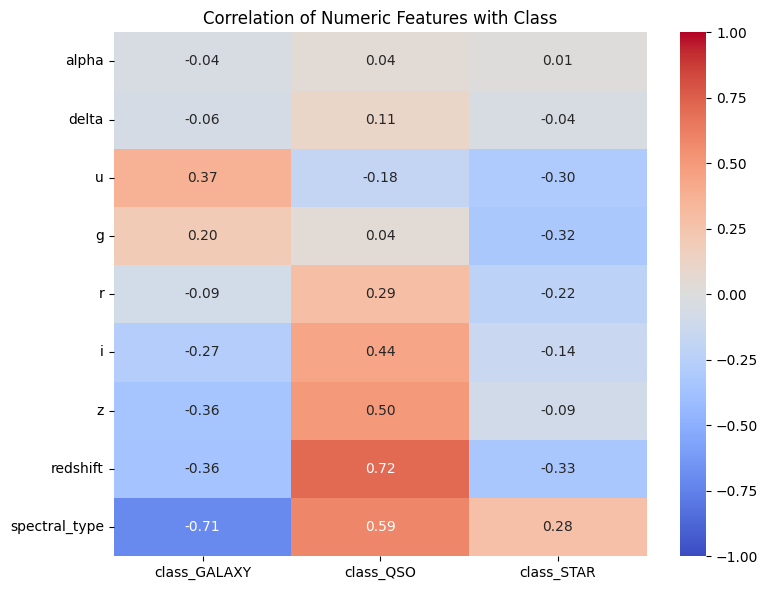

In [ ]:
nicely_print('Correlation of Numeric Columns with Class')

target_col = 'class'

numeric_df = df.select_dtypes(include=['number'])
numeric_df['spectral_type'] = df['spectral_type'].map({'M': 0, 'G/K': 1, 'A/F': 2, 'O/B': 3})

class_dummies = pd.get_dummies(df[target_col], prefix=target_col)

corr_with_class = (
    pd.concat([numeric_df, class_dummies], axis=1)
    .corr()
    .loc[numeric_df.columns, class_dummies.columns]
)

plt.figure(figsize=(8, 6))

sns.heatmap(
    corr_with_class,
    annot=True,
    cmap='coolwarm',
    fmt='.2f',
    vmin=-1,
    vmax=1
)

plt.title('Correlation of Numeric Features with Class')
plt.tight_layout()
plt.show()

> &emsp;<br>
> 1. We can see really strong correlations from `redshift` and `spectral_type`
> 2. We can observe from the pair plot that the `colour values` may produce valuable features when combined.
> <br>&emsp;

---

---

# Custom Transformers

## Feature Extaction

### Colour Features

It extracts differences, sums, products and divisions between all colour channels

In [ ]:
# Extract features from colour
class ColourFeatures(BaseEstimator, TransformerMixin):
    def __init__(self, include: Optional[List[Literal['diff', 'sum', 'prod', 'div', 'mag']]]= None):
        self.diff = include is None or 'diff' in include
        self.sum = include is None or 'sum' in include
        self.prod = include is None or 'prod' in include
        self.div = include is None or 'div' in include
        self.mag = include is None or 'mag' in include

        self.include = include

    def add_stellar_features(self, X_df: pd.DataFrame) -> pd.DataFrame:
        data = X_df.copy()

        colours = ['u', 'g', 'r', 'i', 'z']

        # Colour ratios
        for i in range(len(colours)):
            for j in range(i + 1, len(colours)):
                colour1 = colours[i]
                colour2 = colours[j]

                if self.diff:
                    data[f'{colour1}_{colour2}_diff'] = data[colour1] - data[colour2]
                if self.sum:
                    data[f'{colour1}_{colour2}_sum']  = data[colour1] + data[colour2]
                if self.prod:
                    data[f'{colour1}_{colour2}_prod'] = data[colour1] * data[colour2]
                if self.div:
                    data[f'{colour1}_{colour2}_div']  = data[colour1] / data[colour2].replace(0, np.nan)

        # Brightness summary
        if self.mag:
            data['mean_mag']  = data[colours].mean(axis=1)
            data['mag_std']   = data[colours].std(axis=1)
            data['min_mag']   = data[colours].min(axis=1)
            data['max_mag']   = data[colours].max(axis=1)
            data['mag_range'] = data['max_mag'] - data['min_mag']

        return data

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return self.add_stellar_features(X)
    


nicely_print('Testing:', 'Adding Colour Features')
test = ColourFeatures().fit_transform(X_train)
test.head()

Testing: Adding Colour Features



,alpha,delta,u,g,r,i,z,redshift,spectral_type,galaxy_population,...,r_z_div,i_z_diff,i_z_sum,i_z_prod,i_z_div,mean_mag,mag_std,min_mag,max_mag,mag_range
541493,140.086834,27.914884,25.138566,24.512125,22.052087,20.777275,20.342375,1.115675,M,Red_Sequence,...,1.084047,0.434901,41.119650,422.659119,1.021379,22.564486,2.168735,20.342375,25.138566,4.796191
433890,327.487547,0.161468,23.734640,22.871985,21.708888,20.194465,19.480554,0.679965,M,Blue_Cloud,...,1.114388,0.713910,39.675019,393.399366,1.036647,21.598106,1.778627,19.480554,23.734640,4.254086
161679,191.964952,34.337021,24.207689,23.178122,21.050834,19.952420,19.448849,0.542673,M,Red_Sequence,...,1.082369,0.503571,39.401269,388.051611,1.025892,21.567583,2.057232,19.448849,24.207689,4.758840
213793,198.013822,47.605819,19.201779,17.600837,16.918668,16.871428,16.471289,0.325514,G/K,Red_Sequence,...,1.027161,0.400138,33.342717,277.894166,1.024293,17.412800,1.079293,16.471289,19.201779,2.730490
551247,14.724235,-1.051924,18.683694,16.648581,16.562924,16.429038,16.244485,0.274887,A/F,Blue_Cloud,...,1.019603,0.184553,32.673522,266.881252,1.011361,16.913744,1.001119,16.244485,18.683694,2.439209


### Position Features

It converts RA and Dec into Cartesian coordinates x, y, z.

In [ ]:
# Extract features from position
class PositionFeatures(BaseEstimator, TransformerMixin):
    def __init__(self, return_only_xyz: bool= False):
        self.return_only_xyz = return_only_xyz

    def add_position_features(self, X_df: pd.DataFrame, return_only_xyz: bool= False) -> pd.DataFrame:
        data = X_df.copy()

        if 'alpha' in data.columns and 'delta' in data.columns:
            # Convert coordinates
            ra      = np.radians(data['alpha'].values)
            dec     = np.radians(data['delta'].values)
            ra_cos  = np.cos(ra)
            ra_sin  = np.sin(ra)
            dec_cos = np.cos(dec)
            dec_sin = np.sin(dec)

        else:
            ra_cos  = data['cos_alpha'].values
            ra_sin  = data['sin_alpha'].values
            dec_cos = data['cos_delta'].values
            dec_sin = data['sin_delta'].values

        # Use redshift as distance proxy
        r = data['redshift'].values

        data['x'] = r * dec_cos * ra_cos
        data['y'] = r * dec_cos * ra_sin
        data['z'] = r * dec_sin

        if return_only_xyz:
            return data[['x', 'y', 'z']]

        return data

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return self.add_position_features(X, return_only_xyz= self.return_only_xyz)
    


nicely_print('Testing:', 'Adding Position Features')
test = PositionFeatures(return_only_xyz= True).fit_transform(X_train)
test.head()

Testing: Adding Position Features



,x,y,z
541493,-0.756172,0.632553,0.522314
433890,0.573395,-0.365468,0.001916
161679,-0.438368,-0.092898,0.306100
213793,-0.208713,-0.067870,0.240400
551247,0.265815,0.069855,-0.005047


### Spherical Features

It converts RA and Dec into Cartesian spherical numbers, replacing them with their cos and sin

In [ ]:
# Replace ra and dec with their cos and sin
class SphericalFeatures(BaseEstimator, TransformerMixin):
    def add_cos_sin(self, X_df: pd.DataFrame) -> pd.DataFrame:
        data = X_df.copy()

        ra = np.radians(data['alpha'].values)
        dec = np.radians(data['delta'].values)

        data['cos_alpha'] = np.cos(ra)
        data['sin_alpha'] = np.sin(ra)
        data['cos_delta'] = np.cos(dec)
        data['sin_delta'] = np.sin(dec)

        data = data.drop(['alpha', 'delta'], axis=1)

        return data

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return self.add_cos_sin(X)
    


nicely_print('Testing:', 'Adding Spherical Features')
test = SphericalFeatures().fit_transform(X_train)
test.head()

Testing: Adding Spherical Features



,u,g,r,i,z,redshift,spectral_type,galaxy_population,cos_alpha,sin_alpha,cos_delta,sin_delta
541493,25.138566,24.512125,22.052087,20.777275,20.342375,1.115675,M,Red_Sequence,-0.767018,0.641626,0.883644,0.468159
433890,23.734640,22.871985,21.708888,20.194465,19.480554,0.679965,M,Blue_Cloud,0.843275,-0.537483,0.999996,0.002818
161679,24.207689,23.178122,21.050834,19.952420,19.448849,0.542673,M,Red_Sequence,-0.978275,-0.207313,0.825734,0.564060
213793,19.201779,17.600837,16.918668,16.871428,16.471289,0.325514,G/K,Red_Sequence,-0.950982,-0.309246,0.674227,0.738524
551247,18.683694,16.648581,16.562924,16.429038,16.244485,0.274887,A/F,Blue_Cloud,0.967160,0.254167,0.999831,-0.018359


### Nearest Neighbour Features

It extracts features from the nearest neighbour, such as distance and class

In [ ]:
# Extract features from nearest neighbour
class NearestNeighbourExtractor:
    def __init__(self, n_neighbors: int = 5):
        self.n_neighbors = n_neighbors

        self.knn = NearestNeighbors(
            n_neighbors=max(2, n_neighbors + 1),
            algorithm='kd_tree',
            metric='euclidean',
            n_jobs=-1
        )

        self.position_cols = ['x', 'y', 'z']
        self.pos_features = PositionFeatures(return_only_xyz= True).add_position_features

    def _get_position_features(self, X_df: pd.DataFrame) -> pd.DataFrame:
        if all(col in X_df.columns for col in self.position_cols):
            return X_df[self.position_cols].copy()

        return self.pos_features(X_df, return_only_xyz=True)

    def fit(self, X_df: pd.DataFrame, y) -> "NearestNeighbourExtractor":
        X_pos = self._get_position_features(X_df)

        if isinstance(y, pd.DataFrame):
            y = y['class']

        self.y_train = pd.Series(y).reset_index(drop=True)

        self.classes_ = self.y_train.dropna().unique()

        self.class_to_code_ = {
            cls: i
            for i, cls in enumerate(self.classes_)
        }

        self.y_codes_ = self.y_train.map(self.class_to_code_).values

        self.knn.fit(X_pos.reset_index(drop=True))

        return self

    def extract(self, X_df: pd.DataFrame, skip_self: bool = False) -> pd.DataFrame:
        # skip_self only for training data, since the record is inside the fitted KNN
        X_pos = self._get_position_features(X_df)

        n_neighbors = self.n_neighbors + 1 if skip_self else self.n_neighbors

        distances, neighbours = self.knn.kneighbors(
            X_pos,
            n_neighbors=n_neighbors,
            return_distance=True
        )

        if skip_self:
            distances = distances[:, 1:]
            neighbours = neighbours[:, 1:]

        neighbour_codes = self.y_codes_[neighbours]

        nearest_distance = distances[:, 0]

        # Distance-weighted class voting
        weights = 1 / (distances + 1e-9)

        scores = np.column_stack([
            np.where(neighbour_codes == class_code, weights, 0).sum(axis=1)
            for class_code in range(len(self.classes_))
        ])

        best_class_codes = scores.argmax(axis=1)
        weighted_neighbour_class = self.classes_[best_class_codes]

        total_scores = scores.sum(axis=1)
        weighted_neighbour_confidence = scores[
            np.arange(len(scores)),
            best_class_codes
        ] / total_scores

        return pd.DataFrame(
            {
                'nearest_neighbour_distance': nearest_distance,
                'weighted_neighbour_class': weighted_neighbour_class,
                'weighted_neighbour_confidence': weighted_neighbour_confidence
            },
            index=X_df.index
        )


class NearestNeighbourFeatures(BaseEstimator, TransformerMixin):
    def __init__(self, n_neighbors: int = 5):
        self.n_neighbors = n_neighbors

    def fit(self, X, y=None):
        self.nearest_neighbour_extractor = NearestNeighbourExtractor(
            n_neighbors=self.n_neighbors
        )

        self.nearest_neighbour_extractor.fit(X, y)

        return self

    def transform(self, X):
        nn_features = self.nearest_neighbour_extractor.extract(
            X,
            skip_self=False
        )

        return pd.concat(
            [
                X.reset_index(drop=True),
                nn_features.reset_index(drop=True)
            ],
            axis=1
        )

    def fit_transform(self, X, y=None, **fit_params):
        self.fit(X, y)

        nn_features = self.nearest_neighbour_extractor.extract(
            X,
            skip_self=True
        )

        return pd.concat(
            [
                X.reset_index(drop=True),
                nn_features.reset_index(drop=True)
            ],
            axis=1
        )



nicely_print('Testing:', 'Nearest Neighbour Features')
test = NearestNeighbourFeatures(n_neighbors=5).fit_transform(X_train, y_train)
print(test.shape)
display(test.head())

Testing: Nearest Neighbour Features

(461877, 13)


,alpha,delta,u,g,r,i,z,redshift,spectral_type,galaxy_population,nearest_neighbour_distance,weighted_neighbour_class,weighted_neighbour_confidence
0,140.086834,27.914884,25.138566,24.512125,22.052087,20.777275,20.342375,1.115675,M,Red_Sequence,0.008634,GALAXY,1.0
1,327.487547,0.161468,23.734640,22.871985,21.708888,20.194465,19.480554,0.679965,M,Blue_Cloud,0.009434,GALAXY,1.0
2,191.964952,34.337021,24.207689,23.178122,21.050834,19.952420,19.448849,0.542673,M,Red_Sequence,0.012650,GALAXY,1.0
3,198.013822,47.605819,19.201779,17.600837,16.918668,16.871428,16.471289,0.325514,G/K,Red_Sequence,0.003600,GALAXY,1.0
4,14.724235,-1.051924,18.683694,16.648581,16.562924,16.429038,16.244485,0.274887,A/F,Blue_Cloud,0.001702,GALAXY,1.0


## Skewness & Outliers

In [ ]:
# To handle both
class YeoJohnsonTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns

    def fit(self, X, y=None):
        self.columns_ = [col for col in self.columns if col in X.columns]

        X_fit = X[self.columns_].replace([np.inf, -np.inf], np.nan)

        self.yj = PowerTransformer(method='yeo-johnson')
        self.yj.fit(X_fit)

        return self
    
    def transform(self, X):
        data = X.copy()
        X_transform = data[self.columns_].replace([np.inf, -np.inf], np.nan)
        data[self.columns_] = self.yj.transform(X_transform)

        return data
    
# For outliers
class OutlierClipper(BaseEstimator, TransformerMixin):
    def __init__(self, columns= None, lower_quantile= 0.05, upper_quantile= 0.95, boundaries= None):
        '''
        if boundaries are provided
            boundaries = {
                'col1': (lower, upper),
                'col2': (lower, upper),
                ...
            }
        
        value = value.clip(lower=lower, upper=upper)
        '''
        self.columns = columns
        self.lower_quantile = lower_quantile
        self.upper_quantile = upper_quantile
        self.boundaries = boundaries

    def fit(self, X, y=None):
        data = X.copy()

        if self.columns is None:
            self.columns_ = data.select_dtypes(include='number').columns.tolist()
        else:
            self.columns_ = [col for col in self.columns if col in data.columns]

        self.boundaries_ = {}

        for col in self.columns_:
            if self.boundaries is not None and col in self.boundaries:
                lower, upper = self.boundaries[col]
            else:
                lower = data[col].quantile(self.lower_quantile)
                upper = data[col].quantile(self.upper_quantile)

            self.boundaries_[col] = (lower, upper)

        return self

    def transform(self, X):
        data = X.copy()

        for col, (lower, upper) in self.boundaries_.items():
            data[col] = data[col].clip(lower=lower, upper=upper)

        return data
    


nicely_print('Testing:', 'Skewness & Outlier Handling')
test = YeoJohnsonTransformer(columns= X_train.select_dtypes(include='number').columns.tolist()).fit_transform(X_train, y_train)
display(test.head())

test = OutlierClipper(columns= X_train.select_dtypes(include='number').columns.tolist()).fit_transform(X_train, y_train)
display(test.head())

Testing: Skewness & Outlier Handling



,alpha,delta,u,g,r,i,z,redshift,spectral_type,galaxy_population
541493,-0.371537,0.424222,1.354832,2.528530,1.491816,0.896356,0.813260,0.946152,M,Red_Sequence
433890,1.435922,-1.109882,0.629873,1.122249,1.174951,0.456452,0.223337,0.381876,M,Blue_Cloud
161679,0.153865,0.698425,0.872064,1.361949,0.619420,0.283103,0.202357,0.130258,M,Red_Sequence
213793,0.213571,1.229033,-1.578676,-1.687679,-1.631137,-1.492651,-1.547724,-0.386659,G/K,Red_Sequence
551247,-1.836004,-1.243274,-1.817585,-1.984728,-1.748011,-1.688880,-1.663731,-0.535290,A/F,Blue_Cloud


,alpha,delta,u,g,r,i,z,redshift,spectral_type,galaxy_population
541493,140.086834,27.914884,25.138566,23.286562,22.052087,20.777275,20.342375,1.115675,M,Red_Sequence
433890,327.487547,0.161468,23.734640,22.871985,21.708888,20.194465,19.480554,0.679965,M,Blue_Cloud
161679,191.964952,34.337021,24.207689,23.178122,21.050834,19.952420,19.448849,0.542673,M,Red_Sequence
213793,198.013822,47.605819,19.201779,17.722160,16.987229,16.871428,16.471289,0.325514,G/K,Red_Sequence
551247,14.724235,-1.051924,19.071476,17.722160,16.987229,16.613019,16.333356,0.274887,A/F,Blue_Cloud


## Categorical Encoding

In [ ]:
# One Hot Encoding
class OneHotTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns=None, prefix_sep='_'):
        self.columns = columns
        self.prefix_sep = prefix_sep

    def fit(self, X, y=None):
        if self.columns is None:
            self.columns_ = X.select_dtypes(include=['object', 'category']).columns.tolist()
        else:
            self.columns_ = [col for col in self.columns if col in X.columns]

        dummies = pd.get_dummies(
            X[self.columns_],
            columns= self.columns_,
            prefix_sep= self.prefix_sep
        )

        self.dummy_columns_ = dummies.columns.tolist()

        return self

    def transform(self, X):
        data = X.copy()

        dummies = pd.get_dummies(
            data[self.columns_],
            columns= self.columns_,
            prefix_sep= self.prefix_sep
        )

        dummies = dummies.reindex(columns= self.dummy_columns_, fill_value= 0)

        data = data.drop(columns=self.columns_)
        data = pd.concat([data.reset_index(drop=True), dummies.reset_index(drop=True)], axis=1)

        return data
        


# Ordinal Encoding
class SpectralTypeOrdinalTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns= None, order= None, unknown_value= np.nan):
        self.columns = columns
        self.order = order
        self.unknown_value = unknown_value

    def fit(self, X, y=None):
        if self.columns is None:
            self.columns_ = [col for col in ['spectral_type'] if col in X.columns]
        else:
            self.columns_ = [col for col in self.columns if col in X.columns]

        if self.order is None:
            self.order_ = ['M', 'G/K', 'A/F', 'O/B']
        else:
            self.order_ = self.order

        self.order_map_ = {
            value: i
            for i, value in enumerate(self.order_)
        }

        return self

    def transform(self, X):
        data = X.copy()

        for col in self.columns_:
            data[col] = (
                data[col]
                .map(self.order_map_)
                .fillna(self.unknown_value)
            )

        return data
    


# Binary Encoding
class BinaryTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns=None, positive_values=None):
        self.columns = columns
        self.positive_values = positive_values

    def fit(self, X, y=None):
        if self.columns is None:
            self.columns_ = X.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()
        else:
            self.columns_ = [col for col in self.columns if col in X.columns]

        self.binary_maps_ = {}

        for col in self.columns_:
            values = X[col].dropna().unique().tolist()

            if self.positive_values is not None and col in self.positive_values:
                positive = self.positive_values[col]
            else:
                if len(values) != 2:
                    continue

                positive = sorted(values)[-1]

            self.binary_maps_[col] = positive

        return self

    def transform(self, X):
        data = X.copy()

        for col, positive in self.binary_maps_.items():
            data[col] = (data[col] == positive).astype(int)

        return data
    


nicely_print('Testing:', 'Categorical Column Encoding')
test = NearestNeighbourFeatures(n_neighbors=5).fit_transform(X_train, y_train)
test = OneHotTransformer(columns= ['weighted_neighbour_class']).fit_transform(test, y_train)
test = SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B']).fit_transform(test, y_train)
test = BinaryTransformer(columns= ['galaxy_population']).fit_transform(test, y_train)
test.head()

Testing: Categorical Column Encoding



,alpha,delta,u,g,r,i,z,redshift,spectral_type,galaxy_population,nearest_neighbour_distance,weighted_neighbour_confidence,weighted_neighbour_class_GALAXY,weighted_neighbour_class_QSO,weighted_neighbour_class_STAR
0,140.086834,27.914884,25.138566,24.512125,22.052087,20.777275,20.342375,1.115675,0,1,0.008634,1.0,True,False,False
1,327.487547,0.161468,23.734640,22.871985,21.708888,20.194465,19.480554,0.679965,0,0,0.009434,1.0,True,False,False
2,191.964952,34.337021,24.207689,23.178122,21.050834,19.952420,19.448849,0.542673,0,1,0.012650,1.0,True,False,False
3,198.013822,47.605819,19.201779,17.600837,16.918668,16.871428,16.471289,0.325514,1,1,0.003600,1.0,True,False,False
4,14.724235,-1.051924,18.683694,16.648581,16.562924,16.429038,16.244485,0.274887,2,0,0.001702,1.0,True,False,False


## Numeric Conversion

In [ ]:
class ConvertToNumeric(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        data = X.copy()

        string_cols = data.select_dtypes(include=['object', 'category']).columns.tolist()

        if string_cols:
            raise ValueError(
                f"These columns are still non-numeric before SMOTE: {string_cols}. "
                "Encode them first."
            )

        bool_cols = data.select_dtypes(include=['bool']).columns.tolist()

        for col in bool_cols:
            data[col] = data[col].astype(int)

        return data
    


nicely_print('Testing:', 'Converting to Numeric')
try:
    test = ConvertToNumeric().fit_transform(X_train, y_train)
except ValueError as e:
    print('Good Value Error:', e)

test = OneHotTransformer().fit_transform(X_train, y_train)
test = ConvertToNumeric().fit_transform(test, y_train)
test

Testing: Converting to Numeric

Good Value Error: These columns are still non-numeric before SMOTE: ['spectral_type', 'galaxy_population']. Encode them first.


,alpha,delta,u,g,r,i,z,redshift,spectral_type_A/F,spectral_type_G/K,spectral_type_M,spectral_type_O/B,galaxy_population_Blue_Cloud,galaxy_population_Red_Sequence
0,140.086834,27.914884,25.138566,24.512125,22.052087,20.777275,20.342375,1.115675,0,0,1,0,0,1
1,327.487547,0.161468,23.734640,22.871985,21.708888,20.194465,19.480554,0.679965,0,0,1,0,1,0
2,191.964952,34.337021,24.207689,23.178122,21.050834,19.952420,19.448849,0.542673,0,0,1,0,0,1
3,198.013822,47.605819,19.201779,17.600837,16.918668,16.871428,16.471289,0.325514,0,1,0,0,0,1
4,14.724235,-1.051924,18.683694,16.648581,16.562924,16.429038,16.244485,0.274887,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461872,152.926232,34.073249,23.230362,21.899280,20.784792,19.538979,19.355216,0.267215,0,0,1,0,0,1
461873,350.452000,1.693027,22.372440,21.779945,22.078892,21.673277,21.291139,1.594860,0,0,0,1,1,0
461874,136.204958,1.868255,22.687064,21.531659,20.963671,21.153390,20.985366,0.114593,0,1,0,0,1,0
461875,18.426469,0.387867,22.039938,21.832430,21.802006,21.632619,21.385104,0.240800,1,0,0,0,1,0


## Balance

In [ ]:
# undersample
def undersample_to_targets(
    X: pd.DataFrame,
    y: pd.Series,
    target_counts: dict,
    random_state: int = 42
):
    data = X.copy()
    data['target'] = y.values

    parts = []

    for cls, group in data.groupby('target'):
        target_n = target_counts.get(cls, len(group))

        if len(group) > target_n:
            group = group.sample(n=target_n, random_state=random_state)

        parts.append(group)

    balanced = pd.concat(parts).sample(frac=1, random_state=random_state)

    X_balanced = balanced.drop(columns='target')
    y_balanced = balanced['target']

    return X_balanced, y_balanced


# oversample
def smote_to_targets(
    X: pd.DataFrame,
    y: pd.Series,
    target_counts: dict,
    random_state: int = 42,
    k_neighbors: int = 5
):
    current_counts = y.value_counts()

    sampling_strategy = {
        cls: target_n
        for cls, target_n in target_counts.items()
        if cls in current_counts.index and current_counts[cls] < target_n
    }

    if not sampling_strategy:
        return X.copy(), y.copy()

    min_class_count = current_counts[list(sampling_strategy.keys())].min()

    sampler = SMOTE(
        sampling_strategy= sampling_strategy,
        random_state= random_state,
        k_neighbors= min(k_neighbors, min_class_count - 1)
    )

    X_resampled, y_resampled = sampler.fit_resample(X, y)

    return (
        pd.DataFrame(X_resampled, columns= X.columns),
        pd.Series(y_resampled, name= y.name)
    )



# Combine
class DistributionBalancer(BaseEstimator):
    def __init__(
        self,
        target_distribution,
        target_total= None,
        random_state= 42,
        k_neighbors= 5
    ):
        self.target_distribution = target_distribution
        self.target_total = target_total
        self.random_state = random_state
        self.k_neighbors = k_neighbors

    def _make_target_counts(self, y):
        target_total = self.target_total or len(y)
        total_pct = sum(self.target_distribution.values())

        return {
            cls: int(target_total * pct / total_pct)
            for cls, pct in self.target_distribution.items()
        }

    def fit(self, X, y=None):
        self.target_counts_ = self._make_target_counts(y)
        return self

    def fit_resample(self, X, y):
        self.fit(X, y)

        # 1. Decrease classes above target
        X_bal, y_bal = undersample_to_targets(
            X, y, target_counts= self.target_counts_,
            random_state=self.random_state
        )

        # 2. Increase classes below target
        X_bal, y_bal = smote_to_targets(
            X_bal, y_bal, target_counts= self.target_counts_,
            random_state= self.random_state, k_neighbors= self.k_neighbors
        )

        return X_bal, y_bal
    


nicely_print('Tesing:', 'Balancing')
def test_distribution_balancer(target_distribution):
    test = [
        y_train.value_counts().reindex(CLASS_ORDER).rename_axis('class').reset_index(name='original_count'),

        DistributionBalancer(target_distribution= target_distribution).fit_resample(
            OneHotTransformer().fit_transform(X_train, y_train), y_train
        )[1].value_counts().reindex(CLASS_ORDER).rename_axis('class').reset_index(name='balanced_count')
    ]
    test = test[0].merge(test[1], on='class')
    test['original_percent'] = (test['original_count'] / test['original_count'].sum() * 100).round(2)
    test['balanced_percent'] = (test['balanced_count'] / test['balanced_count'].sum() * 100).round(2)
    test['diff_count'] = test['balanced_count'] - test['original_count']

    return test[['class','original_count','original_percent','balanced_count','balanced_percent', 'diff_count']]

test = test_distribution_balancer({'GALAXY': 45, 'QSO': 30, 'STAR': 25})
display(test)
test = test_distribution_balancer({'GALAXY': 1, 'QSO': 1, 'STAR': 1})
display(test)


Tesing: Balancing



,class,original_count,original_percent,balanced_count,balanced_percent,diff_count
0,GALAXY,301984,65.38,207844,45.0,-94140
1,QSO,93714,20.29,138563,30.0,44849
2,STAR,66179,14.33,115469,25.0,49290


,class,original_count,original_percent,balanced_count,balanced_percent,diff_count
0,GALAXY,301984,65.38,153959,33.33,-148025
1,QSO,93714,20.29,153959,33.33,60245
2,STAR,66179,14.33,153959,33.33,87780


## Scaling

In [ ]:
class Scaler(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.columns_ = X.columns
        self.scaler = RobustScaler()
        self.scaler.fit(X)
        return self

    def transform(self, X):
        return pd.DataFrame(
            self.scaler.transform(X),
            columns=self.columns_,
            index=X.index
        )
    


nicely_print('Tesing:', 'Scaler')
test = OneHotTransformer().fit_transform(X_train, y_train)
test = Scaler().fit_transform(test)
test

Tesing: Scaler



,alpha,delta,u,g,r,i,z,redshift,spectral_type_A/F,spectral_type_G/K,spectral_type_M,spectral_type_O/B,galaxy_population_Blue_Cloud,galaxy_population_Red_Sequence
0,-0.487411,0.187160,0.888915,1.258632,0.693272,0.498228,0.526561,0.882547,0.0,0.0,0.0,0.0,0.0,0.0
1,1.392320,-0.616588,0.403077,0.581028,0.546592,0.244804,0.133167,0.260538,0.0,0.0,0.0,0.0,1.0,-1.0
2,0.032955,0.373147,0.566779,0.707505,0.265347,0.139556,0.118694,0.064544,0.0,0.0,0.0,0.0,0.0,0.0
3,0.093628,0.757416,-1.165554,-1.596681,-1.500694,-1.200155,-1.240469,-0.245466,0.0,1.0,-1.0,0.0,0.0,0.0
4,-1.744867,-0.651729,-1.344841,-1.990093,-1.652734,-1.392520,-1.343998,-0.317740,1.0,0.0,-1.0,0.0,1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461872,-0.358625,0.365508,0.228567,0.179167,0.151644,-0.040221,0.075953,-0.328692,0.0,0.0,0.0,0.0,0.0,0.0
461873,1.622666,-0.572234,-0.068323,0.129866,0.704728,0.887838,0.959642,1.566617,0.0,0.0,-1.0,1.0,1.0,-1.0
461874,-0.526349,-0.567159,0.040555,0.027289,0.228095,0.661775,0.820066,-0.546571,0.0,1.0,-1.0,0.0,1.0,-1.0
461875,-1.707731,-0.610032,-0.183388,0.151549,0.586390,0.870158,1.002534,-0.366401,1.0,0.0,-1.0,0.0,1.0,-1.0


## Feature Selection

Feature Importance Using Random Forest Classifier



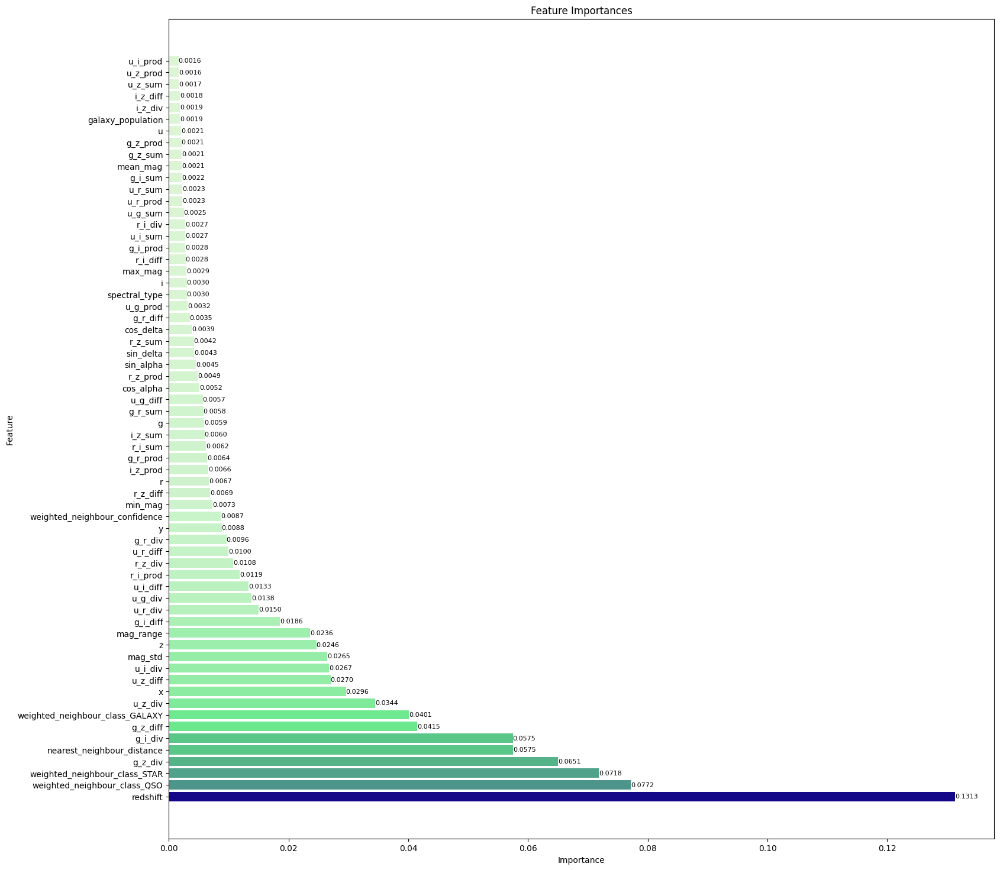

In [ ]:
def get_feature_importance(X_train: pd.DataFrame, y_train: pd.DataFrame) -> tuple[list[str], dict[str, float]]:
    # Train the Random Forest Classifier
    model = RandomForestClassifier(n_estimators= 100, random_state= 123, class_weight= 'balanced_subsample', n_jobs= -1)

    # Fitting the Random Forest Classifier
    model.fit(X_train, y_train)

    # Get feature importances for each feature
    importances = model.feature_importances_
    # Create a DataFrame with feature name: importance
    feature_importances = pd.DataFrame({
        'feature': X_train.columns,
        'importance': importances
    })
    feature_importances = feature_importances.sort_values(by= 'importance', ascending= False)

    return feature_importances['feature'].tolist(), feature_importances

def plot_feature_importance(feature_importances: pd.DataFrame) -> None:
    # Sort the features by importance
    feature_importances = feature_importances.sort_values('importance', ascending= False)
        
    # Plot
    plt.figure(figsize=(18, 18))
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title('Feature Importances')
    # Create a colormap
    cmap = mcolors.LinearSegmentedColormap.from_list('importance_gradient', ['#dcf5d5', '#61e786', '#47798d', '#140888'])
    # Normalize importance values to the range [0, 1] for the colormap
    norm = mcolors.Normalize(
        vmin= feature_importances['importance'].min(),
        vmax= feature_importances['importance'].max()
    )
    colors = [cmap(norm(value)) for value in feature_importances['importance']]
    bars = plt.barh(feature_importances['feature'], feature_importances['importance'], color= colors)
    # Add the value labels to the bars
    for bar in bars:
        value = bar.get_width() # The width of the bar corresponds to the importance value
        plt.text(
            x= value, # x-position is the value of the bar
            y= bar.get_y() + bar.get_height()/2, # y-position is the middle of the bar
            s= f'{value:.4f}', # The text to display, formatted to 4 decimal places
            va= 'center', # Vertically center the text
            ha= 'left', # Horizontally align the text to the left
            fontsize= 8
        )
    plt.xlim(right= feature_importances['importance'].max() * 1.05) # Give a little more space to the right
    plt.show()



nicely_print('Testing:', 'Feature Importance Using Random Forest Classifier')
test = ColourFeatures().fit_transform(X_train, y_train)
# print('ColourFeatures', test.shape, y_train.shape);display(test);display(y_train)
test = PositionFeatures().fit_transform(test, y_train)
# print('PositionFeatures', test.shape, y_train.shape);display(test);display(y_train)
test = SphericalFeatures().fit_transform(test, y_train)
# print('SphericalFeatures', test.shape, y_train.shape);display(test);display(y_train)
test = NearestNeighbourFeatures().fit_transform(test, y_train)
# print('NearestNeighbourFeatures', test.shape, y_train.shape);display(test);display(y_train)
test = OneHotTransformer(columns= ['weighted_neighbour_class']).fit_transform(test, y_train)
# print('OneHotTransformer', test.shape, y_train.shape);display(test);display(y_train)
test = SpectralTypeOrdinalTransformer().fit_transform(test, y_train)
# print('SpectralTypeOrdinalTransformer', test.shape, y_train.shape);display(test);display(y_train)
test = BinaryTransformer().fit_transform(test, y_train)
# print('BinaryTransformer', test.shape, y_train.shape);display(test);display(y_train)
y_test = y_train.map({'GALAXY': 0, 'QSO': 1, 'STAR': 2})
# print('Map', test.shape, y_train.shape);display(y_train)

top_features, feature_importances = get_feature_importance(test, y_test)
plot_feature_importance(feature_importances)

Top Feature Evaluation Evaluating top [20, 30, 40] features with importance >= 0.003

20 features: 0.9502 ± 0.0013
30 features: 0.9542 ± 0.0011
40 features: 0.9548 ± 0.0014


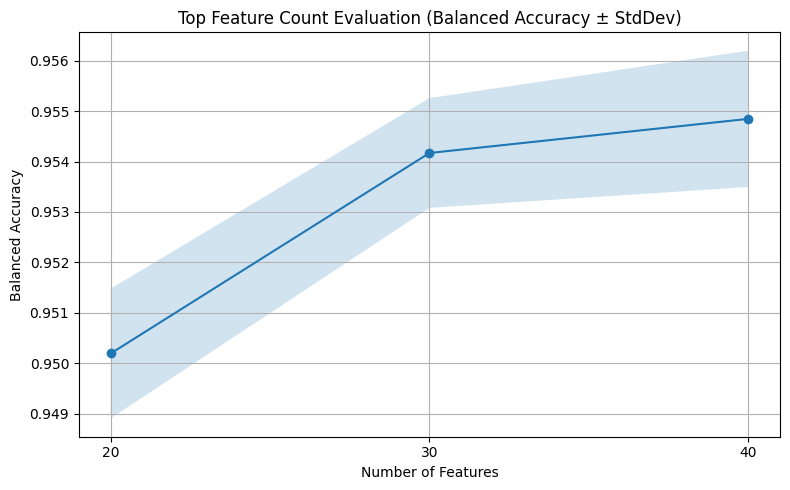

,n_features,balanced_accuracy_mean,balanced_accuracy_std,selected_features
2,40,0.954845,0.001352,"redshift, weighted_neighbour_class_QSO, weight..."
1,30,0.954169,0.001088,"redshift, weighted_neighbour_class_QSO, weight..."
0,20,0.950194,0.001287,"redshift, weighted_neighbour_class_QSO, weight..."


In [ ]:
feature_counts = [20, 30, 40]
sample_frac = 0.3

nicely_print(
    'Testing:',
    f'Evaluating top {feature_counts} features based on importance'
)

test = ColourFeatures().fit_transform(X_train, y_train)
test = PositionFeatures().fit_transform(test, y_train)
test = SphericalFeatures().fit_transform(test, y_train)
test = NearestNeighbourFeatures(n_neighbors= 5).fit_transform(test, y_train)
test = OneHotTransformer(columns= ['weighted_neighbour_class']).fit_transform(test, y_train)
test = SpectralTypeOrdinalTransformer().fit_transform(test, y_train)
test = BinaryTransformer().fit_transform(test, y_train)

y_test = y_train.map({'GALAXY': 0, 'QSO': 1, 'STAR': 2})

rf_importance_model = RandomForestClassifier(
    n_estimators= 100,
    random_state= 123,
    class_weight= 'balanced_subsample',
    n_jobs= -1
)

rf_importance_model.fit(test, y_test)

feature_importances = pd.DataFrame({
    'feature': test.columns,
    'importance': rf_importance_model.feature_importances_
}).sort_values('importance', ascending= False)

selected_importance_features = (
    feature_importances
    .loc[feature_importances['importance'] >= 0, 'feature']
    .tolist()
)

test_eval = test[selected_importance_features].reset_index(drop= True)
y_eval = y_test.reset_index(drop= True)

sample_idx = test_eval.sample(frac= sample_frac, random_state= 123).index

test_eval = test_eval.iloc[sample_idx].reset_index(drop= True)
y_eval = y_eval.iloc[sample_idx].reset_index(drop= True)

cv = StratifiedKFold(
    n_splits= 3,
    shuffle= True,
    random_state= 123
)

model = RandomForestClassifier(
    n_estimators= 40,
    random_state= 123,
    class_weight= 'balanced_subsample',
    n_jobs= -1,
    max_depth= 12
)

results = []

for n_features in feature_counts:
    n_features = min(n_features, len(selected_importance_features))

    selected_features = selected_importance_features[:n_features]

    scores = cross_val_score(
        model,
        test_eval[selected_features],
        y_eval,
        scoring= 'balanced_accuracy',
        cv= cv,
        n_jobs= -1
    )

    print(f'{n_features} features: {scores.mean():.4f} ± {scores.std():.4f}')

    results.append({
        'n_features': n_features,
        'balanced_accuracy_mean': scores.mean(),
        'balanced_accuracy_std': scores.std(),
        'selected_features': selected_features
    })

results = pd.DataFrame(results)

plt.figure(figsize= (8, 5))

plt.plot(
    results['n_features'],
    results['balanced_accuracy_mean'],
    marker= 'o'
)

plt.fill_between(
    results['n_features'],
    results['balanced_accuracy_mean'] - results['balanced_accuracy_std'],
    results['balanced_accuracy_mean'] + results['balanced_accuracy_std'],
    alpha= 0.2
)

plt.title('Top Feature Count Evaluation (Balanced Accuracy ± StdDev)')
plt.xlabel('Number of Features')
plt.ylabel('Balanced Accuracy')
plt.xticks(results['n_features'])
plt.grid(True)
plt.tight_layout()
plt.show()

test_results = results.copy()
test_results['selected_features'] = test_results['selected_features'].apply(lambda x: ', '.join(x))

display(test_results.sort_values('balanced_accuracy_mean', ascending= False))

In [ ]:
class FeatureSelector(BaseEstimator, TransformerMixin):
    def __init__(self, selected_features):
        self.selected_features = selected_features

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X[self.selected_features]
    


nicely_print('Testing:', 'Selecting Features')
test = FeatureSelector(selected_features= ['redshift', 'u']).fit_transform(X_train, y_train)
test

Testing: Selecting Features



,redshift,u
541493,1.115675,25.138566
433890,0.679965,23.734640
161679,0.542673,24.207689
213793,0.325514,19.201779
551247,0.274887,18.683694
...,...,...
246063,0.267215,23.230362
282818,1.594860,22.372440
247414,0.114593,22.687064
230262,0.240800,22.039938


## Dimensionality Reduction

Testing: Dimensionality Reduction (PCA, SVD, LDA)



,pca_1,pca_2,pca_3,pca_4,pca_5,pca_6,pca_7,pca_8,pca_9,pca_10
0,294.808259,46.040884,34.338673,14.230417,1.392774,-1.010673,0.148201,0.001912,0.983349,-0.566580
1,158.573820,19.710803,29.142946,-12.151001,-10.681207,1.189255,-0.234241,0.441568,-0.789649,-0.110652
2,154.904412,42.791637,24.739288,7.529074,1.703619,-0.851854,0.117587,-0.316887,-0.190998,-0.100019
3,-361.946117,-9.443493,-1.970544,-4.133890,3.819356,-0.395762,-0.601655,0.038744,-0.169891,0.544977
4,-417.008140,-16.288258,-11.644637,-7.638852,-3.190409,1.336220,-0.034420,0.392023,0.407527,-0.231462


,svd_1,svd_2,svd_3,svd_4,svd_5,svd_6,svd_7,svd_8,svd_9,svd_10
0,1622.173090,44.260991,44.309925,6.905604,12.710539,5.739592,-1.060703,0.212650,-0.030406,0.927206
1,1486.025292,18.790643,34.421345,-12.285882,-1.883804,-10.348563,1.189762,-0.243873,0.446591,-0.784216
2,1482.807960,41.917858,29.340601,5.206087,4.982252,3.147466,-0.860750,0.133197,-0.323267,-0.205094
3,967.335748,-6.998109,-17.226523,8.656663,-14.889667,-2.957932,-0.409167,-0.585121,0.031107,-0.187452
4,912.556012,-13.476636,-28.655466,4.797998,-14.218768,-9.674514,1.309275,-0.007708,0.373599,0.372850


,lda_1,lda_2
0,-1.825064,-0.867450
1,-1.857293,-0.558196
2,-1.715819,-0.888070
3,-0.887323,0.025571
4,-0.856208,1.224241


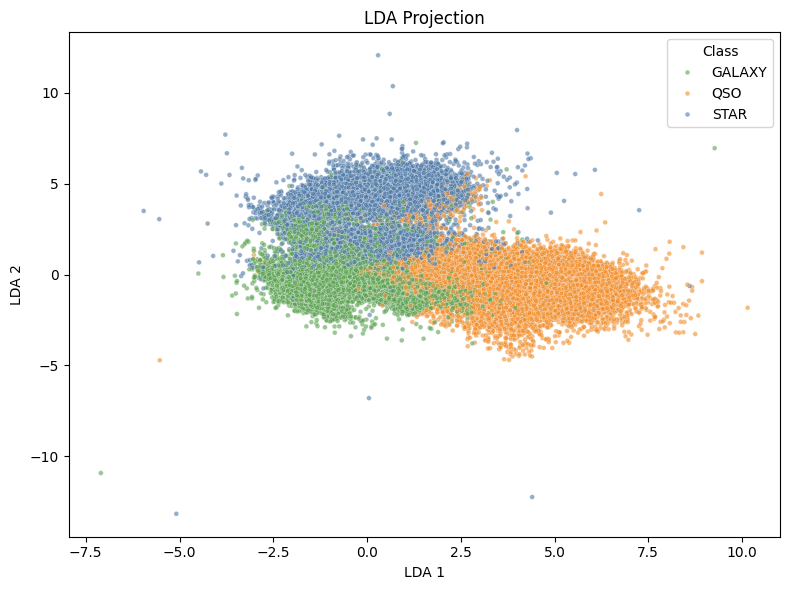

In [ ]:
class PCATransformer(BaseEstimator, TransformerMixin):
    def __init__(self, n_components= 10, random_state= 42):
        self.n_components = n_components
        self.random_state = random_state

    def fit(self, X, y=None):
        self.pca = PCA(
            n_components= self.n_components,
            random_state= self.random_state
        )
        self.pca.fit(X)
        return self

    def transform(self, X):
        data = self.pca.transform(X)

        return pd.DataFrame(
            data,
            columns= [f'pca_{i+1}' for i in range(data.shape[1])],
            index= X.index
        )
    
class SVDTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, n_components= 10, random_state= 42):
        self.n_components = n_components
        self.random_state = random_state

    def fit(self, X, y=None):
        self.svd = TruncatedSVD(
            n_components= self.n_components,
            random_state= self.random_state
        )
        self.svd.fit(X)
        return self

    def transform(self, X):
        data = self.svd.transform(X)

        return pd.DataFrame(
            data,
            columns= [f'svd_{i+1}' for i in range(data.shape[1])],
            index= X.index
        )

class LDATransformer(BaseEstimator, TransformerMixin):
    def __init__(self, n_components= 2, add_features= False):
        self.n_components = n_components
        self.add_features = add_features

    def fit(self, X, y=None):
        self.lda = LDA(n_components= self.n_components)

        self.lda.fit(X, y)

        return self

    def transform(self, X):
        data = self.lda.transform(X)

        new = pd.DataFrame(
            data,
            columns= [f'lda_{i+1}' for i in range(data.shape[1])],
            index= X.index
        )

        if self.add_features:
            return pd.concat([X, new], axis= 1)
        else:
            return new
    

nicely_print('Testing:', 'Dimensionality Reduction (PCA, SVD, LDA)')
test = ColourFeatures().fit_transform(X_train, y_train)
test = PositionFeatures().fit_transform(test, y_train)
test = SphericalFeatures().fit_transform(test, y_train)
test = NearestNeighbourFeatures(n_neighbors= 5).fit_transform(test, y_train)
test = OneHotTransformer(columns= ['weighted_neighbour_class']).fit_transform(test, y_train)
test = SpectralTypeOrdinalTransformer().fit_transform(test, y_train)
test_num = BinaryTransformer().fit_transform(test, y_train)

y_test = y_train.map({'GALAXY': 0, 'QSO': 1, 'STAR': 2})


test = PCATransformer().fit_transform(test_num, y_test)
display(test.head())

test = SVDTransformer().fit_transform(test_num, y_test)
display(test.head())

test = LDATransformer().fit_transform(test_num, y_test)
display(test.head())

frac = 0.5

plot_df = test.copy()
plot_df['class'] = y_train.reset_index(drop= True).values

plot_df = plot_df.sample(frac= frac, random_state= 42)

plt.figure(figsize= (8, 6))

sns.scatterplot(
    data= plot_df,
    x= 'lda_1',
    y= 'lda_2',
    hue= 'class',
    palette= CLASS_COLOURS,
    s= 12,
    alpha= 0.6
)

plt.title('LDA Projection')
plt.xlabel('LDA 1')
plt.ylabel('LDA 2')
plt.legend(title= 'Class')
plt.tight_layout()
plt.show()

## Other Transformers

In [ ]:
# Removes the redshift feature from all data
class RemoveRedshiftTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        X: pd.DataFrame = X.copy()
        X = X.drop('redshift', axis= 1)
        return X

# Filters the data by redshift
class FilterLowRedshift(BaseEstimator):
    def __init__(self, threshold= 0.3, keep: Literal['below', 'above']= 'below'):
        self.threshold = threshold
        self.keep = keep

    def fit_resample(self, X, y):
        X = X.copy()

        if not isinstance(y, pd.Series):
            y = pd.Series(y, index= X.index)

        if self.keep == 'below':
            mask = X['redshift'] < self.threshold
        elif self.keep == 'above':
            mask = X['redshift'] >= self.threshold
        else:
            raise ValueError("keep must be 'below' or 'above'")

        if mask.sum() == 0:
            raise ValueError('No rows left after redshift filtering')

        return X.loc[mask].copy(), y.loc[mask].copy()

# Transforms the data into a binary classification problem
class BinaryPredictionFeature(BaseEstimator, TransformerMixin):
    def __init__(self, fitted_pipeline, new_column_name):
        self.fitted_pipeline = fitted_pipeline
        self.new_column_name = new_column_name

    def __sklearn_clone__(self):
        return BinaryPredictionFeature(
            fitted_pipeline= self.fitted_pipeline,
            new_column_name= self.new_column_name
        )

    def fit(self, X, y=None):
        self.original_columns_ = [
            col for col in X.columns
            if not str(col).startswith('binary_')
        ]
        return self

    def transform(self, X, y=None):
        X = X.copy()

        X_for_prediction = X[self.original_columns_].copy()

        proba = self.fitted_pipeline.predict_proba(X_for_prediction)

        classes = list(self.fitted_pipeline.classes_)

        positive_classes = [
            cls for cls in classes
            if not str(cls).startswith('NOT_')
        ]

        if len(positive_classes) != 1:
            raise ValueError('Could not identify exactly one positive class')

        positive_class = positive_classes[0]
        positive_class_index = classes.index(positive_class)

        X[self.new_column_name] = proba[:, positive_class_index]

        return X

---

---

# Reusable Model Functions

## Argument Filtering

In [ ]:
def filter_args_for_pipeline(pipe, pipe_args= None, model_args= None):
    if pipe_args is None:
        p_args = {
            'nn_features__n_neighbors': [2, 5],
            'outlier_clipper__boundaries': [None, {
                'u': (16, 30), 'g': (15, 27), 'r': (15, 25),
                'i': (15, 25), 'z': (15, 25), 'redshift': (0, 3)
            }],
            'svd__n_components': [10, 30],
            'pca__n_components': [10, 30]
        }
    else: p_args = pipe_args

    if model_args is None: m_args = {}
    else: m_args = model_args

    args = {**p_args, **m_args}
    
    return {
        key: value
        for key, value in args.items()
        if key.split('__')[0] in pipe.named_steps
    }

## Cross-Validation

In [ ]:
def run_cv_for_pipelines(
    pipelines,
    X_train,
    y_train,
    title= 'Testing Pipelines',
    subtitle= '3-fold CV on training data',
    n_splits= 3
):
    nicely_print(title, subtitle)

    cv = StratifiedKFold(
        n_splits= n_splits,
        shuffle= True,
        random_state= 42
    )

    rows = []

    for name, pipe in pipelines.items():
        print(f'Testing {name}...')

        scores = cross_validate(
            pipe,
            X_train,
            y_train,
            cv= cv,
            scoring= {
                'balanced_accuracy': 'balanced_accuracy',
                'accuracy': 'accuracy',
                'f1_macro': 'f1_macro',
                'f1_weighted': 'f1_weighted'
            },
            n_jobs= 1,
            error_score= 'raise'
        )

        rows.append({
            'Pipeline': name,
            'Balanced Accuracy Mean': round(scores['test_balanced_accuracy'].mean(), 4),
            'Balanced Accuracy Std': round(scores['test_balanced_accuracy'].std(), 4),
            'Accuracy Mean': round(scores['test_accuracy'].mean(), 4),
            'Accuracy Std': round(scores['test_accuracy'].std(), 4),
            'F1 Macro Mean': round(scores['test_f1_macro'].mean(), 4),
            'F1 Macro Std': round(scores['test_f1_macro'].std(), 4),
            'F1 Weighted Mean': round(scores['test_f1_weighted'].mean(), 4),
            'F1 Weighted Std': round(scores['test_f1_weighted'].std(), 4),
            'Fit Time Mean': round(scores['fit_time'].mean(), 2)
        })

        print(
            f'- Balanced Accuracy: {BOLD}{scores["test_balanced_accuracy"].mean():.4f}{RESET} '
            f'± {scores["test_balanced_accuracy"].std():.4f} ({scores["fit_time"].mean():.2f}s)\n'
        )

    results_df = (
        pd.DataFrame(rows)
        .sort_values('Balanced Accuracy Mean', ascending= False)
        .reset_index(drop= True)
    )

    display(results_df)

    return results_df

def run_cv_for_binary_pipelines(
    binary_pipelines,
    X_train,
    binary_y_train,
    title= 'Testing Binary Pipelines',
    subtitle= '3-fold CV on training data',
    n_splits= 3
):
    nicely_print(title, subtitle)

    cv = StratifiedKFold(
        n_splits= n_splits,
        shuffle= True,
        random_state= 42
    )

    rows = []

    for name, item in binary_pipelines.items():
        cls = item['positive_class']
        pipe = item['pipeline']

        print(f'Testing {name}...')

        scores = cross_validate(
            pipe,
            X_train,
            binary_y_train[cls],
            cv= cv,
            scoring= {
                'balanced_accuracy': 'balanced_accuracy',
                'accuracy': 'accuracy',
                'f1_macro': 'f1_macro',
                'f1_weighted': 'f1_weighted'
            },
            n_jobs= 1,
            error_score= 'raise'
        )

        rows.append({
            'Pipeline': name,
            'Base Pipeline': item['base_pipeline'],
            'Positive Class': cls,
            'Balanced Accuracy Mean': round(scores['test_balanced_accuracy'].mean(), 4),
            'Balanced Accuracy Std': round(scores['test_balanced_accuracy'].std(), 4),
            'Accuracy Mean': round(scores['test_accuracy'].mean(), 4),
            'F1 Macro Mean': round(scores['test_f1_macro'].mean(), 4),
            'F1 Weighted Mean': round(scores['test_f1_weighted'].mean(), 4),
            'Fit Time Mean': round(scores['fit_time'].mean(), 2)
        })

        print(
            f'- Balanced Accuracy: {BOLD}{scores["test_balanced_accuracy"].mean():.4f}{RESET} '
            f'± {scores["test_balanced_accuracy"].std():.4f} ({scores["fit_time"].mean():.2f}s)\n'
        )

    results_df = (
        pd.DataFrame(rows)
        .sort_values(['Base Pipeline', 'Balanced Accuracy Mean'], ascending= [True, False])
        .reset_index(drop= True)
    )

    display(results_df)

    return results_df

## Fit

In [ ]:
def fit_pipelines(
    pipelines,
    X_train,
    y_train,
    title= 'Fitting Pipelines',
    subtitle= 'Final fit on training data'
):
    nicely_print(title, subtitle)

    fitted_pipelines = {}

    for name, pipe in pipelines.items():
        print(f'Fitting {name}...')

        fitted_pipelines[name] = clone(pipe)
        fitted_pipelines[name].fit(X_train, y_train)

        print('Stored\n')

    return fitted_pipelines

def fit_binary_pipelines(
    binary_pipelines,
    X_train,
    binary_y_train,
    title= 'Fitting Binary Pipelines',
    subtitle= 'Final fit on training data'
):
    nicely_print(title, subtitle)

    fitted_binary_pipelines = {}

    for name, item in binary_pipelines.items():
        cls = item['positive_class']
        pipe = item['pipeline']

        print(f'Fitting {name}...')

        fitted_pipe = clone(pipe)
        fitted_pipe.fit(X_train, binary_y_train[cls])

        fitted_binary_pipelines[name] = {
            'base_pipeline': item['base_pipeline'],
            'positive_class': cls,
            'pipeline': fitted_pipe
        }

        print('Stored\n')

    return fitted_binary_pipelines

## Predict

In [ ]:
def get_ordered_proba(pipe, X, labels):
    proba = pipe.predict_proba(X)

    proba_df = pd.DataFrame(
        proba,
        columns= pipe.classes_,
        index= X.index
    )

    return proba_df[labels].values

## Evaluate

In [ ]:
def plot_confusion_matrices_and_reports(
    cm_results: dict[str, Any],
    report_results: dict[str, str],
    labels: list[str] = ['No Stroke', 'Stroke'],
    ncols: int = 3
) -> None:
    n_models = len(cm_results)
    nrows = ceil(n_models / ncols)

    _, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6 * ncols, 5 * nrows))

    if n_models == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for ax, (pipe_name, cm) in zip(axes, cm_results.items()):
        sns.heatmap(
            cm, annot= True, fmt= 'd', cmap= 'Blues', 
            xticklabels= labels, yticklabels= labels, 
            ax= ax
        )
        ax.set_xlabel('Predicted')
        ax.set_ylabel('Actual')
        ax.set_title(pipe_name)

    # Hide empty subplots
    for ax in axes[n_models:]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

    print('\nClassification Reports\n')
    for pipe_name, report in report_results.items():
        print(f'{"=" * 80}')
        print(pipe_name)
        print(f'{"=" * 80}')
        print(report)
        print()

def _combine_binary_models_to_multiclass(
    fitted_binary_pipelines,
    X_test,
    y_test,
    selected_binary_models,
    labels= CLASS_ORDER,
    model_name= 'binary_3_models'
):
    positive_probas = {}
    binary_predictions = {}

    for cls, binary_name in selected_binary_models.items():
        item = fitted_binary_pipelines[binary_name]

        if isinstance(item, dict):
            pipe = item['pipeline']
        else:
            pipe = item

        binary_pred = pipe.predict(X_test)
        binary_proba = pipe.predict_proba(X_test)

        binary_proba = pd.DataFrame(
            binary_proba,
            columns= pipe.classes_,
            index= X_test.index
        )

        positive_probas[cls] = binary_proba[cls].values
        binary_predictions[cls] = binary_pred

    proba_matrix = np.column_stack([
        positive_probas[cls]
        for cls in labels
    ])

    multiclass_pred = np.array(labels)[
        np.argmax(proba_matrix, axis= 1)
    ]

    error_df = X_test.copy()
    error_df['actual_class'] = y_test.values
    error_df['predicted_class'] = multiclass_pred
    error_df['correct'] = error_df['actual_class'] == error_df['predicted_class']

    for i, cls in enumerate(labels):
        error_df[f'proba_{cls}'] = proba_matrix[:, i]
        error_df[f'is_{cls}_binary_prediction'] = binary_predictions[cls]

    result_df = pd.DataFrame([{
        'Pipeline': model_name,
        'Balanced Accuracy': round(balanced_accuracy_score(y_test, multiclass_pred), 4),
        'Accuracy': round(accuracy_score(y_test, multiclass_pred), 4),
        'Precision Macro': round(precision_score(y_test, multiclass_pred, average= 'macro', zero_division= 0), 4),
        'Recall Macro': round(recall_score(y_test, multiclass_pred, average= 'macro', zero_division= 0), 4),
        'F1 Macro': round(f1_score(y_test, multiclass_pred, average= 'macro', zero_division= 0), 4),
        'F1 Weighted': round(f1_score(y_test, multiclass_pred, average= 'weighted', zero_division= 0), 4)
    }])

    return result_df, error_df, multiclass_pred, proba_matrix

def evaluate_binary_pipeline_groups(
    fitted_binary_pipelines,
    X_test,
    y_test,
    binary_y_test,
    labels= CLASS_ORDER,
    title= 'Evaluating Binary Pipeline Groups',
    subtitle= '3 binary models combined into multiclass prediction',
    prefix= 'low_binary_3_models',
    ncols= 3
):
    nicely_print(title, subtitle)

    binary_individual_results = []

    nicely_print('Individual Binary Model Evaluation')

    for name, item in fitted_binary_pipelines.items():
        base_name = item['base_pipeline']
        cls = item['positive_class']
        pipe = item['pipeline']

        print(f'Evaluating {name}...')

        y_binary_pred = pipe.predict(X_test)
        y_binary_proba = pipe.predict_proba(X_test)

        y_binary_proba = pd.DataFrame(
            y_binary_proba,
            columns= pipe.classes_,
            index= X_test.index
        )

        binary_individual_results.append({
            'Pipeline': name,
            'Base Pipeline': base_name,
            'Positive Class': cls,
            'Balanced Accuracy': round(balanced_accuracy_score(binary_y_test[cls], y_binary_pred), 4),
            'Accuracy': round(accuracy_score(binary_y_test[cls], y_binary_pred), 4),
            'Precision Macro': round(precision_score(binary_y_test[cls], y_binary_pred, average= 'macro', zero_division= 0), 4),
            'Recall Macro': round(recall_score(binary_y_test[cls], y_binary_pred, average= 'macro', zero_division= 0), 4),
            'F1 Macro': round(f1_score(binary_y_test[cls], y_binary_pred, average= 'macro', zero_division= 0), 4),
            'F1 Weighted': round(f1_score(binary_y_test[cls], y_binary_pred, average= 'weighted', zero_division= 0), 4),
            f'Average Proba {cls}': round(y_binary_proba[cls].mean(), 4)
        })

    binary_individual_df = (
        pd.DataFrame(binary_individual_results)
        .sort_values(['Positive Class', 'Balanced Accuracy'], ascending= [True, False])
        .reset_index(drop= True)
    )

    display(binary_individual_df)

    grouped_models = {}

    for name, item in fitted_binary_pipelines.items():
        base_name = item['base_pipeline']
        cls = item['positive_class']

        if base_name not in grouped_models:
            grouped_models[base_name] = {}

        grouped_models[base_name][cls] = name

    final_results = []
    cm_results = {}
    report_results = {}
    error_dfs = {}
    pred_results = {}
    proba_results = {}

    nicely_print('Combined Binary Group Evaluation')

    for base_name, selected_binary_models in grouped_models.items():
        if set(selected_binary_models.keys()) != set(labels):
            print(f'Skipping {base_name}: missing binary models')
            continue

        model_name = f'{prefix}__{base_name}'

        result_df, error_df, y_pred, y_proba = _combine_binary_models_to_multiclass(
            fitted_binary_pipelines= fitted_binary_pipelines,
            X_test= X_test,
            y_test= y_test,
            selected_binary_models= selected_binary_models,
            labels= labels,
            model_name= model_name
        )

        result_row = result_df.iloc[0].to_dict()

        result_row['AUC OVR Weighted'] = round(
            roc_auc_score(
                y_test,
                y_proba,
                labels= labels,
                multi_class= 'ovr',
                average= 'weighted'
            ),
            4
        )

        final_results.append(result_row)

        cm_results[model_name] = confusion_matrix(
            y_test,
            y_pred,
            labels= labels
        )

        report_results[model_name] = classification_report(
            y_test,
            y_pred,
            labels= labels,
            digits= 4,
            zero_division= 0
        )

        error_dfs[model_name] = error_df
        pred_results[model_name] = y_pred
        proba_results[model_name] = y_proba

    final_df = (
        pd.DataFrame(final_results)
        .sort_values('Balanced Accuracy', ascending= False)
        .reset_index(drop= True)
    )

    plot_confusion_matrices_and_reports(
        cm_results,
        report_results,
        labels= labels,
        ncols= ncols
    )

    display(final_df)

    for name, error_df in error_dfs.items():
        print(name)

        plot_interactive_3d_celestial_map(
            data= error_df,
            class_col= 'actual_class',
            colour_col= 'predicted_class',
            actual_col= 'actual_class',
            predicted_col= 'predicted_class',
            wrong_only= True,
            sample_frac= 1,
            title= f'Binary Wrong Classifications - {name}',
            point_size= 3
        )

    return final_df, cm_results, report_results, error_dfs, pred_results, proba_results

In [ ]:
def evaluate_pipelines_with_curves(
    fitted_pipelines,
    X_test,
    y_test,
    labels= CLASS_ORDER,
    title= 'Evaluating Pipelines',
    subtitle= 'Test set performance',
    plot_title_prefix= 'Wrong Classifications',
    ncols= 3
):
    nicely_print(title, subtitle)

    final_results = []
    cm_results = {}
    report_results = {}
    roc_results = {}
    p_r_results = {}
    error_dfs = {}
    pred_results = {}
    proba_results = {}

    assert len(X_test) == len(y_test)

    y_bin = label_binarize(
        y_test,
        classes= labels
    )

    for name, pipe in fitted_pipelines.items():
        print(f'Evaluating {name}...')

        y_pred = pipe.predict(X_test)
        y_proba = get_ordered_proba(pipe, X_test, labels)

        pred_results[name] = y_pred
        proba_results[name] = y_proba

        final_results.append({
            'Pipeline': name,
            'Balanced Accuracy': round(balanced_accuracy_score(y_test, y_pred), 4),
            'Accuracy': round(accuracy_score(y_test, y_pred), 4),
            'Precision Macro': round(precision_score(y_test, y_pred, average= 'macro', zero_division= 0), 4),
            'Recall Macro': round(recall_score(y_test, y_pred, average= 'macro', zero_division= 0), 4),
            'F1 Macro': round(f1_score(y_test, y_pred, average= 'macro', zero_division= 0), 4),
            'F1 Weighted': round(f1_score(y_test, y_pred, average= 'weighted', zero_division= 0), 4),
            'AUC OVR Weighted': round(
                roc_auc_score(
                    y_test,
                    y_proba,
                    labels= labels,
                    multi_class= 'ovr',
                    average= 'weighted'
                ),
                4
            )
        })

        error_df = X_test.copy()
        error_df['actual_class'] = y_test.values
        error_df['predicted_class'] = y_pred
        error_df['correct'] = error_df['actual_class'] == error_df['predicted_class']

        for i, cls in enumerate(labels):
            error_df[f'proba_{cls}'] = y_proba[:, i]

        error_dfs[name] = error_df

        cm_results[name] = confusion_matrix(
            y_test,
            y_pred,
            labels= labels
        )

        report_results[name] = classification_report(
            y_test,
            y_pred,
            labels= labels,
            digits= 4,
            zero_division= 0
        )

        roc_results[name] = {}
        p_r_results[name] = {}

        for i, cls in enumerate(labels):
            fpr, tpr, _ = roc_curve(y_bin[:, i], y_proba[:, i])
            auc = roc_auc_score(y_bin[:, i], y_proba[:, i])
            roc_results[name][cls] = (fpr, tpr, auc)

            precision, recall, _ = precision_recall_curve(y_bin[:, i], y_proba[:, i])
            ap = average_precision_score(y_bin[:, i], y_proba[:, i])
            p_r_results[name][cls] = (precision, recall, ap)

    final_df = (
        pd.DataFrame(final_results)
        .sort_values('Balanced Accuracy', ascending= False)
        .reset_index(drop= True)
    )

    plot_confusion_matrices_and_reports(
        cm_results,
        report_results,
        labels= labels,
        ncols= ncols
    )

    display(final_df)

    for name, error_df in error_dfs.items():
        print(name)

        plot_interactive_3d_celestial_map(
            data= error_df,
            class_col= 'actual_class',
            colour_col= 'predicted_class',
            actual_col= 'actual_class',
            predicted_col= 'predicted_class',
            wrong_only= True,
            sample_frac= 1,
            title= f'{plot_title_prefix} - {name}',
            point_size= 3
        )

    return (
        final_df,           cm_results, 
        report_results,     roc_results, 
        p_r_results,        error_dfs, 
        pred_results,       proba_results
    )

## Error Analysis

In [ ]:
def build_error_analysis(
    error_dfs,
    X_test,
    y_test,
    hard_error_threshold= 2,
    title= 'Error Checks'
):
    nicely_print(title, 'Repeated errors across pipelines')

    model_names = list(error_dfs.keys())
    feature_cols = X_test.columns.tolist()

    error_analysis_df = X_test[feature_cols].copy()
    error_analysis_df['actual_class'] = y_test.values

    pred_df = pd.DataFrame(index= X_test.index)
    wrong_df = pd.DataFrame(index= X_test.index)

    for name in model_names:
        pred_df[f'{name}_pred'] = error_dfs[name]['predicted_class'].values
        wrong_df[f'{name}_wrong'] = pred_df[f'{name}_pred'].values != y_test.values

    error_analysis_df = pd.concat(
        [error_analysis_df, pred_df, wrong_df],
        axis= 1
    )

    pred_cols = pred_df.columns.tolist()
    wrong_cols = wrong_df.columns.tolist()

    error_analysis_df['how_many_classifiers_wrong'] = (
        error_analysis_df[wrong_cols]
        .sum(axis= 1)
    )

    wrong_predictions_only = pred_df.where(wrong_df.values)

    error_analysis_df['main_wrong_prediction'] = (
        wrong_predictions_only
        .mode(axis= 1, dropna= True)[0]
        .fillna(error_analysis_df['actual_class'])
    )

    error_count_df = (
        error_analysis_df[error_analysis_df['how_many_classifiers_wrong'] > 0]
        .groupby(
            [
                'actual_class',
                'main_wrong_prediction',
                'how_many_classifiers_wrong'
            ]
        )
        .size()
        .reset_index(name= 'count')
        .sort_values(
            ['how_many_classifiers_wrong', 'count'],
            ascending= [False, False]
        )
        .reset_index(drop= True)
    )

    hard_errors_df = (
        error_analysis_df[
            error_analysis_df['how_many_classifiers_wrong'] >= hard_error_threshold
        ]
        [
            [
                'actual_class',
                'main_wrong_prediction',
                'how_many_classifiers_wrong'
            ]
            + feature_cols
            + pred_cols
        ]
        .sort_values(
            ['how_many_classifiers_wrong', 'actual_class', 'main_wrong_prediction'],
            ascending= [False, True, True]
        )
        .reset_index(drop= True)
    )

    display(error_count_df)
    display(hard_errors_df)

    return error_analysis_df, error_count_df, hard_errors_df

## Binary Model Helpers

In [ ]:
def make_binary_target(y, positive_class):
    return y.apply(
        lambda value: positive_class if value == positive_class else f'NOT_{positive_class}'
    )

def make_binary_targets(y_train, y_test, labels= CLASS_ORDER):
    binary_y_train = {}
    binary_y_test = {}

    for cls in labels:
        binary_y_train[cls] = make_binary_target(y_train, cls)
        binary_y_test[cls] = make_binary_target(y_test, cls)

    return binary_y_train, binary_y_test

def make_binary_pipelines(
    base_pipelines,
    y_train,
    y_test,
    labels= CLASS_ORDER,
    prefix= 'low_binary'
):
    binary_pipelines = {}
    binary_y_train = {}
    binary_y_test = {}

    for cls in labels:
        binary_y_train[cls] = make_binary_target(y_train, cls)
        binary_y_test[cls] = make_binary_target(y_test, cls)

    for base_name, base_pipe in base_pipelines.items():
        for cls in labels:
            binary_name = f'{prefix}__{base_name}__is_{cls.lower()}'

            pipe = clone(base_pipe)

            if 'distribution_balancer' in pipe.named_steps:
                pipe.set_params(
                    distribution_balancer__target_distribution= {
                        cls: 1,
                        f'NOT_{cls}': 1
                    }
                )

            binary_pipelines[binary_name] = {
                'base_pipeline': base_name,
                'positive_class': cls,
                'pipeline': pipe
            }

    for cls in labels:
        print(cls)
        print(binary_y_train[cls].value_counts())
        print()

    print(f'Total binary pipelines: {len(binary_pipelines)}')

    return binary_pipelines, binary_y_train, binary_y_test

---

---

# Model Training & Evaluation

In [ ]:
pipelines = {}
results = {}
best_fitted_pipelines = {}

## Models on All Data

### Multiclass Models on All Data

In [ ]:
key = 'all_multiclass'
binary_or_multiclass = 'Multiclass'
data = 'All Data'

#### Pipelines

In [ ]:
top_features = ['redshift', 'weighted_neighbour_class_QSO', 'min_mag', 
'weighted_neighbour_class_STAR', 'g_z_div', 'nearest_neighbour_distance',
'g_i_div', 'g_z_diff', 'weighted_neighbour_class_GALAXY', 'u_z_div', 'x', 
'u_z_diff', 'u_i_div', 'mag_std', 'z', 'mag_range', 'g_i_diff', 'u_r_div',
'u_g_div', 'u_i_diff', 'r_i_prod', 'r_z_div', 'y', 'r_z_diff', 'r',
'i_z_prod', 'weighted_neighbour_confidence', 'g_r_prod']

pipelines[key] = {
    'all__mlp': ImbPipeline([
        # Feature extraction
        ('colour_features', ColourFeatures()),
        ('position_features', PositionFeatures()),
        ('spherical_features', SphericalFeatures()),
        ('nn_features', NearestNeighbourFeatures()),
        # Handle outliers
        ('outlier_clipper', OutlierClipper()),
        # Unskew
        ('yeojohnson', YeoJohnsonTransformer(columns= ['u', 'g', 'r', 'i', 'z', 'redshift'])),
        # Categorical value encoding
        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),
        ('class_one_hot', OneHotTransformer(columns= ['weighted_neighbour_class'])),
        # Balancing & Scale
        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),
        ('distribution_balancer', DistributionBalancer(target_distribution= {'GALAXY': 45, 'QSO': 30, 'STAR': 25})),
        # Feature selection
        ('feature_selector', FeatureSelector(selected_features= top_features)),
        # Dimensionality reduction
        ('pca', PCATransformer()),
        ('lda', LDATransformer(add_features= True)), # Could be used for feature extraction as well

        ('mlp', MLPClassifier(hidden_layer_sizes= (64, 32), max_iter= 150, random_state= 42))
    ]),

    'scale__lda_features__hgb': Pipeline([
        ('colour_features', ColourFeatures()),
        ('position_features', PositionFeatures()),
        ('spherical_features', SphericalFeatures()),
        ('nn_features', NearestNeighbourFeatures()),

        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),
        ('class_one_hot', OneHotTransformer(columns= ['weighted_neighbour_class'])),

        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),

        ('lda', LDATransformer(add_features= True)),

        ('hgb', HistGradientBoostingClassifier(random_state= 42, max_iter= 1000))
    ]),

    'scale__balance__lda_features__hgb': ImbPipeline([
        ('colour_features', ColourFeatures()),
        ('position_features', PositionFeatures()),
        ('spherical_features', SphericalFeatures()),
        ('nn_features', NearestNeighbourFeatures()),

        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),
        ('class_one_hot', OneHotTransformer(columns= ['weighted_neighbour_class'])),

        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),
        ('distribution_balancer', DistributionBalancer(target_distribution= {'GALAXY': 1, 'QSO': 1, 'STAR': 1})),

        ('lda', LDATransformer(add_features= True)),

        ('hgb', HistGradientBoostingClassifier(random_state= 42, max_iter= 1000))
    ]),

    'scale__little_imbalance__lda_features__hgb': ImbPipeline([
        ('colour_features', ColourFeatures()),
        ('position_features', PositionFeatures()),
        ('spherical_features', SphericalFeatures()),
        ('nn_features', NearestNeighbourFeatures()),

        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),
        ('class_one_hot', OneHotTransformer(columns= ['weighted_neighbour_class'])),

        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),
        ('distribution_balancer', DistributionBalancer(target_distribution= {'GALAXY': 37, 'QSO': 33, 'STAR': 30})),

        ('lda', LDATransformer(add_features= True)),

        ('hgb', HistGradientBoostingClassifier(random_state= 42, max_iter= 1000))
    ]),

    'scale__balanced__lda_features__pca__mlp': ImbPipeline([
        ('colour_features', ColourFeatures()),
        ('position_features', PositionFeatures()),
        ('spherical_features', SphericalFeatures()),
        ('nn_features', NearestNeighbourFeatures()),

        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),
        ('class_one_hot', OneHotTransformer(columns= ['weighted_neighbour_class'])),

        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),
        ('distribution_balancer', DistributionBalancer(target_distribution= {'GALAXY': 1, 'QSO': 1, 'STAR': 1})),

        ('lda', LDATransformer(add_features= True)),
        ('pca', PCATransformer()),

        ('mlp', MLPClassifier(hidden_layer_sizes= (64, 32), max_iter= 150, random_state= 42))
    ]),

    'scale__little_imbalance__lda_features__svd__mlp': ImbPipeline([
        ('colour_features', ColourFeatures()),
        ('position_features', PositionFeatures()),
        ('spherical_features', SphericalFeatures()),
        ('nn_features', NearestNeighbourFeatures()),

        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),
        ('class_one_hot', OneHotTransformer(columns= ['weighted_neighbour_class'])),

        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),
        ('distribution_balancer', DistributionBalancer(target_distribution= {'GALAXY': 37, 'QSO': 33, 'STAR': 30})),
        
        ('lda', LDATransformer(add_features= True)),
        ('svd', SVDTransformer()),

        ('mlp', MLPClassifier(hidden_layer_sizes= (64, 32), max_iter= 150, random_state= 42))
    ]),

    'balanced__no_lda__only_colour_diff__hgb': ImbPipeline([
        ('colour_features', ColourFeatures(include= ['diff'])),
        ('position_features', PositionFeatures()),
        ('spherical_features', SphericalFeatures()),
        ('nn_features', NearestNeighbourFeatures()),

        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),
        ('class_one_hot', OneHotTransformer(columns= ['weighted_neighbour_class'])),

        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),
        ('distribution_balancer', DistributionBalancer(target_distribution= {'GALAXY': 1, 'QSO': 1, 'STAR': 1})),

        ('hgb', HistGradientBoostingClassifier(random_state= 42, max_iter= 1000, l2_regularization= 0.01, max_leaf_nodes= 31))
    ]),

    'little_balanced__no_redshift__hgb': ImbPipeline([
        ('remove_redshift', RemoveRedshiftTransformer()),

        ('colour_features', ColourFeatures()),
        ('spherical_features', SphericalFeatures()),

        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),

        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),
        ('distribution_balancer', DistributionBalancer(target_distribution= {'GALAXY': 45, 'QSO': 30, 'STAR': 25})),

        ('hgb', HistGradientBoostingClassifier(random_state= 42, max_iter= 1000, l2_regularization= 0.01, max_leaf_nodes= 31))
    ]),

    'little_balanced__no_costum_features__hgb': ImbPipeline([
        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),

        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),
        ('distribution_balancer', DistributionBalancer(target_distribution= {'GALAXY': 45, 'QSO': 30, 'STAR': 25})),

        ('rf', RandomForestClassifier(random_state= 42, n_estimators= 300, max_depth= 20, max_features= 'sqrt'))
    ]),

    'little_balanced__no_lda__only_colour_diff__redshift_skewness__hgb': ImbPipeline([
        ('colour_features', ColourFeatures(include= ['diff'])),
        ('position_features', PositionFeatures()),
        ('spherical_features', SphericalFeatures()),
        ('nn_features', NearestNeighbourFeatures()),

        ('redshift_skewness', YeoJohnsonTransformer(columns= ['redshift'])),

        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),
        ('class_one_hot', OneHotTransformer(columns= ['weighted_neighbour_class'])),

        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),
        ('distribution_balancer', DistributionBalancer(target_distribution= {'GALAXY': 45, 'QSO': 30, 'STAR': 25})),

        ('hgb', HistGradientBoostingClassifier(random_state= 42, max_iter= 1000, l2_regularization= 0.01, max_leaf_nodes= 31))
    ]),
}

nicely_print(f'{binary_or_multiclass} Models on {data}', 'Pipeline Definition')

#### Cross-Validation

In [ ]:
results[key] = run_cv_for_pipelines(
    pipelines= pipelines[key],
    X_train= X_train,
    y_train= y_train,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= f'3-Fold CV on {data}',
    n_splits= 3
)

#### Grid Search

In [ ]:
false = False
if false:
    model_args = {
        'hgb__max_iter': [500],
        'hgb__max_leaf_nodes': [31, 63],
        'hgb__l2_regularization': [0.0, 0.01],

        'rf__n_estimators': [200, 300],
        'rf__max_depth': [None, 20],
        'rf__max_features': ['sqrt'],

        'mlp__hidden_layer_sizes': [(64, 32), (128, 64)],
        'mlp__alpha': [0.0001, 0.001],
        'mlp__learning_rate_init': [0.001, 0.0005],
        'mlp__batch_size': [256]
    }

    best_pipelines = {
        pipe: pipelines[key][pipe]
        for pipe in results[key].head()
    }
    pipe_args = {}

    for name, pipe in best_pipelines.items():
        pipe_args[name] = filter_args_for_pipeline(pipe, model_args= model_args)

    nicely_print('Multiclass Models on All Data', 'Grid Search')
    skf = StratifiedKFold(n_splits= 3, shuffle= True, random_state= 42)
    b = {}

    for pipe_name, pipe in best_pipelines.items():
        print(f'\n{BOLD}{pipe_name}{RESET}:')
        # For every pipeline run 5 fold CV on every set of parametres
        gs = GridSearchCV(
            pipe,
            param_grid= pipe_args[pipe_name],
            scoring= 'balanced_accuracy',
            cv= skf,
            n_jobs= -1
        )
        gs.fit(X_train, y_train)
        b[pipe_name] = gs.best_estimator_
        print(f'Best CV F1:  {gs.best_score_:.4f}')
        print(f'Best Params: {gs.best_params_}')

Grid Search On All Data


scale__balance__lda_features__hgb:
Best CV F1:  0.9623
Best Params: {'hgb__l2_regularization': 0.01, 'hgb__max_iter': 500, 'hgb__max_leaf_nodes': 31, 'nn_features__n_neighbors': 5}

scale__little_imbalance__lda_features__hgb:
Best CV F1:  0.9618
Best Params: {'hgb__l2_regularization': 0.01, 'hgb__max_iter': 500, 'hgb__max_leaf_nodes': 31, 'nn_features__n_neighbors': 5}

scale__balance__lda_features__rf:
Best CV F1:  0.9590
Best Params: {'nn_features__n_neighbors': 5, 'rf__max_depth': 20, 'rf__max_features': 'sqrt', 'rf__n_estimators': 300}

scale__little_imbalance__lda_features__rf:


KeyboardInterrupt: 

> &emsp;<br>
> **3 hours** for the same results!
> <br>&emsp;

**Multiclass Models on All Data** Grid Search <br>
 <br>
 <br>
scale__balance__lda_features__hgb: <br>
Best CV F1:  0.9623 <br>
Best Params: {'hgb__l2_regularization': 0.01, 'hgb__max_iter': 500, 'hgb__max_leaf_nodes': 31, 'nn_features__n_neighbors': 5} <br>
 <br>
scale__little_imbalance__lda_features__hgb: <br>
Best CV F1:  0.9618 <br>
Best Params: {'hgb__l2_regularization': 0.01, 'hgb__max_iter': 500, 'hgb__max_leaf_nodes': 31, 'nn_features__n_neighbors': 5} <br>
 <br>
scale__balance__lda_features__rf: <br>
Best CV F1:  0.9590 <br>
Best Params: {'nn_features__n_neighbors': 5, 'rf__max_depth': 20, 'rf__max_features': 'sqrt', 'rf__n_estimators': 300} <br>
 <br>
scale__little_imbalance__lda_features__rf:

#### Fit

In [ ]:
labels = CLASS_ORDER
y_test = y_test_original.copy()

assert len(X_test) == len(y_test)

best_pipelines = {
    pipe: pipelines[key][pipe]
    for pipe in results[key].head()
}

best_fitted_pipelines[key] = fit_pipelines(
    pipelines= best_pipelines,
    X_train= X_train,
    y_train= y_train,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Fitting Best Pipelines'
)

#### Evaluate

In [ ]:
# final_df, cm_results, report_results, roc_results, p_r_results, error_dfs, pred_results, proba_results
_, _, _, _, _, error_dfs, _, _ = evaluate_pipelines_with_curves(
    fitted_pipelines= best_fitted_pipelines[key],
    X_test= X_test,
    y_test= y_test,
    labels= labels,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Evaluating Best Pipelines',
    plot_title_prefix= 'Final Wrong Classifications',
    ncols= 3
)

#### Error Analysis

In [ ]:
hard_error_threshold = 2 if 'binary' in binary_or_multiclass.lower() else len(best_fitted_pipelines[key]) - 2

# error_analysis_df, error_count_df, hard_errors_df
_, _, _ = build_error_analysis(
    error_dfs= error_dfs,
    X_test= X_test,
    y_test= y_test,
    hard_error_threshold= hard_error_threshold,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Error Analysis'
)

---

### Binary Models on All Data

In [ ]:
key = 'all_binary'
binary_or_multiclass = 'Binary'
data = 'All Data'

labels = CLASS_ORDER
y_test = y_test_original.copy()

#### Pipelines

In [ ]:
pipelines = {
    
}

pipelines[key], binary_y_train, binary_y_test = make_binary_pipelines(
    base_pipelines= pipelines,
    y_train= y_train,
    y_test= y_test,
    labels= labels,
    prefix= key
)

nicely_print(f'{binary_or_multiclass} Models on {data}', 'Pipeline Definition')

#### Cross-Validation

In [ ]:
results[key] = run_cv_for_binary_pipelines(
    binary_pipelines= pipelines[key],
    X_train= X_train,
    binary_y_train= binary_y_train,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= f'3-Fold CV on {data}',
    n_splits= 3
)

#### Fit

In [ ]:
best_fitted_pipelines[key] = fit_binary_pipelines(
    binary_pipelines= pipelines[key],
    X_train= X_train,
    binary_y_train= binary_y_train,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Fitting Binary Pipelines'
)

#### Evaluate

In [ ]:
# binary_final_df, binary_cm_results, binary_report_results, error_dfs, binary_pred_results, binary_proba_results
_, _, _, error_dfs, _, _ = evaluate_binary_pipeline_groups(
    fitted_binary_pipelines= best_fitted_pipelines[key],
    X_test= X_test,
    y_test= y_test,
    binary_y_test= binary_y_test,
    labels= labels,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Evaluating Binary Models and Binary Groups',
    prefix= f'{key}_3_models',
    ncols= 3
)

#### Error Analysis

In [ ]:
hard_error_threshold = 2 if 'binary' in binary_or_multiclass.lower() else len(best_fitted_pipelines[key]) - 2

# error_analysis_df, error_count_df, hard_errors_df
_, _, _ = build_error_analysis(
    error_dfs= error_dfs,
    X_test= X_test,
    y_test= y_test,
    hard_error_threshold= hard_error_threshold,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Error Analysis'
)

---

## Models on Low Redshift Data

### Multiclass Models on Low Redshift Data

In [ ]:
key = 'low_multiclass'
binary_or_multiclass = 'Multiclass'
data = 'Low Redshift Data'

#### Pipelines

In [ ]:
pipelines[key] = {
    'low_balanced__hgb': ImbPipeline([
        ('colour_features', ColourFeatures()),
        ('position_features', PositionFeatures()),
        ('spherical_features', SphericalFeatures()),
        ('nn_features', NearestNeighbourFeatures(n_neighbors= 5)),

        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),
        ('class_one_hot', OneHotTransformer(columns= ['weighted_neighbour_class'])),

        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),
        ('distribution_balancer', DistributionBalancer(target_distribution= {'GALAXY': 1, 'QSO': 1, 'STAR': 1})),

        ('hgb', HistGradientBoostingClassifier(random_state= 42, max_iter= 1000, l2_regularization= 0.01, max_leaf_nodes= 31))
    ]),

    'low_balanced__little_new_features__hgb': ImbPipeline([
        ('colour_features', ColourFeatures(include= ['diff'])),
        ('spherical_features', SphericalFeatures()),

        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),

        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),
        ('distribution_balancer', DistributionBalancer(target_distribution= {'GALAXY': 1, 'QSO': 1, 'STAR': 1})),

        ('hgb', HistGradientBoostingClassifier(random_state= 42, max_iter= 1000, l2_regularization= 0.01, max_leaf_nodes= 31))
    ]),

    'low_little_balanced__hgb': ImbPipeline([
        ('colour_features', ColourFeatures(include= ['diff'])),
        ('spherical_features', SphericalFeatures()),

        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),

        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),
        ('distribution_balancer', DistributionBalancer(target_distribution= {'GALAXY': 45, 'QSO': 30, 'STAR': 25})),

        ('hgb', HistGradientBoostingClassifier(random_state= 42, max_iter= 1000, l2_regularization= 0.01, max_leaf_nodes= 31))
    ]),

    'low_balanced__no_redshift__hgb': ImbPipeline([
        ('remove_redshift', RemoveRedshiftTransformer()),
        ('colour_features', ColourFeatures(include= ['diff'])),
        ('spherical_features', SphericalFeatures()),

        ('spectral_type_ordinal', SpectralTypeOrdinalTransformer(columns= ['spectral_type'], order= ['M', 'G/K', 'A/F', 'O/B'])),
        ('galaxy_population_binary', BinaryTransformer(columns= ['galaxy_population'])),

        ('convert_to_numeric', ConvertToNumeric()),
        ('scaler', Scaler()),
        ('distribution_balancer', DistributionBalancer(target_distribution= {'GALAXY': 1, 'QSO': 1, 'STAR': 1})),

        ('hgb', HistGradientBoostingClassifier(random_state= 42, max_iter= 1000, l2_regularization= 0.01, max_leaf_nodes= 31))
    ]),
}

nicely_print(f'{binary_or_multiclass} Models on {data}', 'Pipeline Definition')

#### Cross-Validation

In [ ]:
results[key] = run_cv_for_pipelines(
    pipelines= pipelines[key],
    X_train= low_X_train,
    y_train= low_y_train,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= f'3-Fold CV on {data}',
    n_splits= 3
)

#### Fit

In [ ]:
labels = CLASS_ORDER
low_y_test = low_y_test_original.copy()

assert len(low_X_test) == len(low_y_test)

best_pipelines = {
    pipe: pipelines[key][pipe]
    for pipe in results[key].head()
}

best_fitted_pipelines[key] = fit_pipelines(
    pipelines= best_pipelines,
    X_train= low_X_train,
    y_train= low_y_train,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Fitting Best Pipelines'
)

#### Evaluate

In [ ]:
# final_df, cm_results, report_results, roc_results, p_r_results, error_dfs, pred_results, proba_results
_, _, _, _, _, error_dfs, _, _ = evaluate_pipelines_with_curves(
    fitted_pipelines= best_fitted_pipelines[key],
    X_test= low_X_test,
    y_test= low_y_test,
    labels= labels,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Evaluating Best Pipelines',
    plot_title_prefix= 'Final Wrong Classifications',
    ncols= 3
)

#### Error Analysis

In [ ]:
hard_error_threshold = 2 if 'binary' in binary_or_multiclass.lower() else len(best_fitted_pipelines[key]) - 2

# error_analysis_df, error_count_df, hard_errors_df
_, _, _ = build_error_analysis(
    error_dfs= error_dfs,
    X_test= low_X_test,
    y_test= low_y_test,
    hard_error_threshold= hard_error_threshold,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Error Analysis'
)

---

### Binary Models on Low Redshift Data

In [ ]:
key = 'low_binary'
binary_or_multiclass = 'Binary'
data = 'Low Redshift Data'

labels = CLASS_ORDER
low_y_test = low_y_test_original.copy()

#### Pipelines

In [ ]:
pipelines = {
    
}

pipelines[key], low_binary_y_train, low_binary_y_test = make_binary_pipelines(
    base_pipelines= pipelines,
    y_train= low_y_train,
    y_test= low_y_test,
    labels= labels,
    prefix= key
)

nicely_print(f'{binary_or_multiclass} Models on {data}', 'Pipeline Definition')

#### Cross-Validation

In [ ]:
results[key] = run_cv_for_binary_pipelines(
    binary_pipelines= pipelines[key],
    X_train= low_X_train,
    binary_y_train= low_binary_y_train,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= f'3-Fold CV on {data}',
    n_splits= 3
)

#### Fit

In [ ]:
best_fitted_pipelines[key] = fit_binary_pipelines(
    binary_pipelines= pipelines[key],
    X_train= low_X_train,
    binary_y_train= low_binary_y_train,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Fitting Binary Pipelines'
)

#### Evaluate

In [ ]:
# low_binary_final_df, low_binary_cm_results, low_binary_report_results, error_dfs, low_binary_pred_results, low_binary_proba_results
_, _, _, error_dfs, _, _ = evaluate_binary_pipeline_groups(
    fitted_binary_pipelines= best_fitted_pipelines[key],
    X_test= low_X_test,
    y_test= low_y_test,
    binary_y_test= low_binary_y_test,
    labels= labels,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Evaluating Binary Models and Binary Groups',
    prefix= f'{key}_3_models',
    ncols= 3
)

#### Error Analysis

In [ ]:
hard_error_threshold = 2 if 'binary' in binary_or_multiclass.lower() else len(best_fitted_pipelines[key]) - 2

# error_analysis_df, error_count_df, hard_errors_df
_, _, _ = build_error_analysis(
    error_dfs= error_dfs,
    X_test= low_X_test,
    y_test= low_y_test,
    hard_error_threshold= hard_error_threshold,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Error Analysis'
)

---

## Models on High Redshift Data

### Multiclass Models on High Redshift Data

In [ ]:
key = 'high_multiclass'
binary_or_multiclass = 'Multiclass'
data = 'High Redshift Data'

#### Pipelines

In [ ]:
pipelines[key] = {
    
}

nicely_print(f'{binary_or_multiclass} Models on {data}', 'Pipeline Definition')

#### Cross-Validation

In [ ]:
results[key] = run_cv_for_pipelines(
    pipelines= pipelines[key],
    X_train= high_X_train,
    y_train= high_y_train,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= f'3-Fold CV on {data}',
    n_splits= 3
)

#### Fit

In [ ]:
labels = CLASS_ORDER
high_y_test = high_y_test_original.copy()

assert len(high_X_test) == len(high_y_test)

best_pipelines = {
    pipe: pipelines[key][pipe]
    for pipe in results[key].head()
}

best_fitted_pipelines[key] = fit_pipelines(
    pipelines= best_pipelines,
    X_train= high_X_train,
    y_train= high_y_train,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Fitting Best Pipelines'
)

#### Evaluate

In [ ]:
# final_df, cm_results, report_results, roc_results, p_r_results, error_dfs, pred_results, proba_results
_, _, _, _, _, error_dfs, _, _ = evaluate_pipelines_with_curves(
    fitted_pipelines= best_fitted_pipelines[key],
    X_test= high_X_test,
    y_test= high_y_test,
    labels= labels,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Evaluating Best Pipelines',
    plot_title_prefix= 'Final Wrong Classifications',
    ncols= 3
)

#### Error Analysis

In [ ]:
hard_error_threshold = 2 if 'binary' in binary_or_multiclass.lower() else len(best_fitted_pipelines[key]) - 2

# error_analysis_df, error_count_df, hard_errors_df
_, _, _ = build_error_analysis(
    error_dfs= error_dfs,
    X_test= high_X_test,
    y_test= high_y_test,
    hard_error_threshold= hard_error_threshold,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Error Analysis'
)

---

### Binary Models on High Redshift Data

In [ ]:
key = 'high_binary'
binary_or_multiclass = 'Binary'
data = 'High Redshift Data'

labels = CLASS_ORDER
high_y_test = high_y_test_original.copy()

#### Pipelines

In [ ]:
pipelines[key] = {
    
}

pipelines[key], high_binary_y_train, high_binary_y_test = make_binary_pipelines(
    base_pipelines= pipelines,
    y_train= high_y_train,
    y_test= high_y_test,
    labels= labels,
    prefix= key
)

nicely_print(f'{binary_or_multiclass} Models on {data}', 'Pipeline Definition')

#### Cross-Validation

In [ ]:
results[key] = run_cv_for_binary_pipelines(
    binary_pipelines= pipelines[key],
    X_train= high_X_train,
    binary_y_train= high_binary_y_train,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= f'3-Fold CV on {data}',
    n_splits= 3
)

#### Fit

In [ ]:
best_fitted_pipelines[key] = fit_binary_pipelines(
    binary_pipelines= pipelines[key],
    X_train= high_X_train,
    binary_y_train= high_binary_y_train,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Fitting Binary Pipelines'
)

#### Evaluate

In [ ]:
# high_binary_final_df, high_binary_cm_results, high_binary_report_results, error_dfs, high_binary_pred_results, high_binary_proba_results
_, _, _, error_dfs, _, _ = evaluate_binary_pipeline_groups(
    fitted_binary_pipelines= best_fitted_pipelines[key],
    X_test= high_X_test,
    y_test= high_y_test,
    binary_y_test= high_binary_y_test,
    labels= labels,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Evaluating Binary Models and Binary Groups',
    prefix= f'{key}_3_models',
    ncols= 3
)

#### Error Analysis

In [ ]:
hard_error_threshold = 2 if 'binary' in binary_or_multiclass.lower() else len(best_fitted_pipelines[key]) - 2

# error_analysis_df, error_count_df, hard_errors_df
_, _, _ = build_error_analysis(
    error_dfs= error_dfs,
    X_test= high_X_test,
    y_test= high_y_test,
    hard_error_threshold= hard_error_threshold,
    title= f'{binary_or_multiclass} Models on {data}',
    subtitle= 'Error Analysis'
)

---

## Model Combinations & Meta-Models